### **IMPORT MODULES**

In [51]:
# Import all modules required for project
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import brier_score_loss, roc_auc_score, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import calibration_curve
from sklearn.metrics import roc_curve, auc
from xgboost import XGBClassifier
import itertools
import nflreadpy as nfl
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import requests
from io import BytesIO
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle, Arc
import numpy as np
from scipy.interpolate import griddata

In [92]:
sup_df_final[(sup_df_final['play_id'] == 3832) & (sup_df_final['game_id'] == 2023122406)]['yards_to_go']

12080    10
Name: yards_to_go, dtype: int64

In [ ]:
sup_df_final

Index(['game_id', 'season', 'week', 'game_date', 'game_time_eastern',
       'home_team_abbr', 'visitor_team_abbr', 'play_id', 'play_description',
       'quarter', 'game_clock', 'down', 'yards_to_go', 'possession_team',
       'defensive_team', 'yardline_side', 'yardline_number',
       'pre_snap_home_score', 'pre_snap_visitor_score',
       'play_nullified_by_penalty', 'pass_result', 'pass_length',
       'offense_formation', 'receiver_alignment', 'route_of_targeted_receiver',
       'play_action', 'dropback_type', 'dropback_distance',
       'pass_location_type', 'defenders_in_the_box', 'team_coverage_man_zone',
       'team_coverage_type', 'penalty_yards', 'pre_penalty_yards_gained',
       'yards_gained', 'expected_points', 'expected_points_added',
       'pre_snap_home_team_win_probability',
       'pre_snap_visitor_team_win_probability',
       'home_team_win_probability_added', 'visitor_team_win_probility_added'],
      dtype='object')

### **DATA FETCHING AND CLEANING**

In [3]:
# Function to fetch the input and output data
def fetch_data(path_to_data, file_path):
    # Pull all related data files from path_to_data + file_path
    pull_data = glob.glob(os.path.join(path_to_data, file_path))
    # Create a list to store the data pulled from each file
    data_list = []
    # Read in the data as a dataframe from each file in pull_data and append to data_list
    for data in pull_data:
        df = pd.read_csv(data)
        data_list.append(df)
    # Concatenate all of the dataframes stored in data_list and return the final dataframe
    data_final = pd.concat(data_list, ignore_index = True)
    return data_final

# Define the path to the data (replace with path to data)
path_to_data = r'C:\Users\Sarvesh\ML_Final_Project_NFL_BDB\nfl_bdd_data\train'

# Fetch the input data (input_2023_w01, input_2023_w02, input_2023_w03, ..., input_2023_w18)
input_path = "input_2023_w*.csv"
input_df_final = fetch_data(path_to_data, input_path)

# Fetch the output data (output_2023_w01, output_2023_w02, output_2023_w03, ..., output_2023_w18)
output_path = "output_2023_w*.csv"
output_df_final = fetch_data(path_to_data, output_path)

# Also, fetch the supplementary data (replace with path to data)
sup_df_final = pd.read_csv(r'C:\Users\Sarvesh\ML_Final_Project_NFL_BDB\nfl_bdd_data\supplementary_data.csv')

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\1643762924.py:27: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  sup_df_final = pd.read_csv(r'C:\Users\Sarvesh\ML_Final_Project_NFL_BDB\nfl_bdd_data\supplementary_data.csv')


In [4]:
# First, check for null entries in input_df_final, output_df_final, and sup_df_final
input_df_final.isnull().sum() # no columns have null values in input_df_final
output_df_final.isnull().sum() # no colums have null values in output_df_final
sup_df_final.isnull().sum() # few columns with null values (penalty_yards can be filled with zeros)

# Fill in the null values for penalty yards with zero
sup_df_final['penalty_yards'].fillna(0, inplace=True)

# Include a column label for input and output frames
input_df_final['tracking'] = 'pre_release'
output_df_final['tracking'] = 'post_release'

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\4253325918.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  sup_df_final['penalty_yards'].fillna(0, inplace=True)


In [5]:
# Copy the relevant player info from the input frames to the output frames
player_info = [
    col for col in input_df_final.columns
    if col not in ['x', 'y', 's', 'a', 'dir', 'o', 'tracking', 'frame_id', 
                   'game_id', 'play_id', 'nfl_id']
]

# Pull the relevant player info from one of the input frames
input_player_info = (
    input_df_final[['game_id', 'play_id', 'nfl_id'] + player_info]
    .drop_duplicates(subset = ['game_id', 'play_id', 'nfl_id'])
)

# Merge the player info into the output_df_final data
output_df_final = output_df_final.merge(input_player_info, 
                                        on = ['game_id', 'play_id', 'nfl_id'], how = 'left')


In [6]:
# Concatenate the input_df_final and output_df_final together
in_out_merged = pd.concat([input_df_final, output_df_final], ignore_index = True)

# Remove players that don't have both input and output data
in_out_merged = in_out_merged[in_out_merged['player_to_predict'] == True].reset_index(drop=True)

# Convert the tracking column to a categorical column
in_out_merged['tracking'] = pd.Categorical(
    in_out_merged['tracking'], 
    categories = ['pre_release', 'post_release'], 
    ordered = True
)

# Sort the values in nfl_merge_final by game_id, play_id, nfl_id, tracking, and frame_id
in_out_merged = in_out_merged.sort_values(
    ['game_id', 'play_id', 'nfl_id', 'tracking', 'frame_id']
).reset_index(drop = True)

In [7]:
# Merge the input data (tracking before the ball is released) with the supplementary data (play info)
nfl_merge_final = pd.merge(in_out_merged, sup_df_final, 
                           on = ['game_id', 'play_id'], how = 'left')

In [8]:
# Consider plays where the defensive coverage is only man coverage
man_coverage = ['COVER_1_MAN', 'COVER_0_MAN', 'COVER_2_MAN']
nfl_man_def = nfl_merge_final[nfl_merge_final['team_coverage_type'].isin(man_coverage)]

In [9]:
# Consider only the entries with player_role of defensive coverge or targeted receiver
player_role = ['Defensive Coverage', 'Targeted Receiver']
nfl_rec_def = nfl_man_def[nfl_man_def['player_role'].isin(player_role)]

In [10]:
# Create a matchup table between Targeted Receivers and Defensive Coverage
nfl_rec_def_cpy = nfl_rec_def.copy()

# Pull the first frame with regards to pre-release of the ball
pre_frame = nfl_rec_def_cpy[(nfl_rec_def_cpy['tracking']=='pre_release') & (nfl_rec_def_cpy['frame_id']==1)]

# Pull the first frame with regards to post_release of the ball
post_frame = nfl_rec_def_cpy[(nfl_rec_def_cpy['tracking']=='post_release') & (nfl_rec_def_cpy['frame_id']==1)]

# For each play, find the primary defender on hte targeted receiver
match_group = post_frame.groupby(['game_id', 'play_id'])

# Create a matchup list for every target receiver/primary defender matchup
matchup_list = []

for (game_id, play_id), group in match_group:
    # Pull the targeted receiver from the group
    receiver_post = group[group['player_role'] == 'Targeted Receiver']
    if receiver_post.empty:
        continue
    receiver_post = receiver_post.iloc[0]

    # Pull all the post_release coverage defenders from the group
    defenders_post = group[group['player_role'] == 'Defensive Coverage']
    if defenders_post.empty:
        continue

    # For each coverage defender, calculate their post-release frame 1 distance to the targeted receiver
    defenders_post = defenders_post.assign(
        dist_to_rec_post = ((defenders_post['x'] - receiver_post['x'])**2 + (defenders_post['y'] - receiver_post['y'])**2)**0.5
    )

    # For each coverage defender, calculate their pre-release frame 1 distance to the targeted receiver
    group_pre = pre_frame[(pre_frame['game_id']==game_id) & (pre_frame['play_id']==play_id)]
    receiver_pre = group_pre[group_pre['player_role'] == 'Targeted Receiver']
    if receiver_pre.empty:
        continue
    receiver_pre = receiver_pre.iloc[0]

    defenders_pre = group_pre[group_pre['player_role'] == 'Defensive Coverage']
    defenders_pre = defenders_pre.assign(
        dist_to_rec_pre = ((defenders_pre['x'] - receiver_pre['x'])**2 + (defenders_pre['y'] - receiver_pre['y'])**2)**0.5
    )

    # The primary defender is determined by the defender closest to the target receiver with respect to the post_release frame 1
    primary_def = defenders_post.loc[defenders_post['dist_to_rec_post'].idxmin()]

    # Store the pre-release distance for the primary defender who is also closest to the ball post_release
    primary_def_pre = defenders_pre[defenders_pre['nfl_id'] == primary_def['nfl_id']]
    if primary_def_pre.empty:
        continue
    dist_pre = primary_def_pre.iloc[0]['dist_to_rec_pre']

    # Determine the offense/defense win probabilities 
    if receiver_post['possession_team'] == receiver_post['home_team_abbr']:
        pre_snap_off_win_prob = receiver_post['pre_snap_home_team_win_probability']
        pre_snap_def_win_prob = receiver_post['pre_snap_visitor_team_win_probability']
        off_win_prob_added = receiver_post['home_team_win_probability_added']
        def_win_prob_added = receiver_post['visitor_team_win_probility_added']
    else:
        pre_snap_off_win_prob = receiver_post['pre_snap_visitor_team_win_probability']
        pre_snap_def_win_prob = receiver_post['pre_snap_home_team_win_probability']
        off_win_prob_added = receiver_pre['visitor_team_win_probility_added']
        def_win_prob_added = receiver_pre['home_team_win_probability_added']

    matchup_list.append({
        # Information about the game and play
        'game_id': game_id, 
        'play_id': play_id, 
        'season' : receiver_post['season'],
        'week': receiver_post['week'],
        'home_team_abbr': receiver_post['home_team_abbr'], 
        'away_team_abbr': receiver_post['visitor_team_abbr'],
        'play_down': receiver_post['down'],
        'play_yards_to_first': receiver_post['yards_to_go'],
        
        # Information about target receiver and offense strategy
        'target_rec_nfl_id': receiver_post['nfl_id'],
        'target_rec_name': receiver_post['player_name'], 
        'target_rec_pos': receiver_post['player_position'],
        'target_rec_team': receiver_post['possession_team'],
        'offense_formation': receiver_post['offense_formation'],
        'target_rec_route' : receiver_post['route_of_targeted_receiver'],
        'play_action': receiver_post['play_action'],

        # Information about primary defender and defense strategy
        'primary_def_nfl_id': primary_def['nfl_id'], 
        'primary_def_name': primary_def['player_name'],
        'primary_def_pos': primary_def['player_position'],
        'primary_def_team': receiver_post['defensive_team'], 
        'team_coverage_type': primary_def['team_coverage_type'],
        
        # Tracking data while the ball is in the air and additional play information
        'dist_to_rec_post': primary_def['dist_to_rec_post'],
        'dist_to_rec_pre' : dist_pre,
        'ball_land_x': primary_def['ball_land_x'],
        'ball_land_y': primary_def['ball_land_y'],
        'pass_length' : receiver_post['pass_length'],
        'penalty_yards': receiver_post['penalty_yards'],
        'pre_penalty_yards_gained' : receiver_post['pre_penalty_yards_gained'],
        'yards_gained' : receiver_post['yards_gained'],

        # Metrics to determine the success of the play
        'exp_pts': receiver_post['expected_points'], 
        'exp_pts_added': receiver_post['expected_points_added'], 
        'pre_snap_off_win_prob': pre_snap_off_win_prob, 
        'pre_snap_def_win_prob' : pre_snap_def_win_prob, 
        'off_win_prob_added': off_win_prob_added, 
        'def_win_prob_added': def_win_prob_added,
        'pass_result': receiver_post['pass_result']
     }
    )

# Convert matchup_list to a Pandas DataFrame
nfl_rec_def_match = pd.DataFrame(matchup_list)

In [11]:
# Filter the primary defensive position to only cornerbacks, for now
nfl_rec_def_match = nfl_rec_def_match[nfl_rec_def_match['primary_def_pos'] == 'CB']

In [12]:
# Visualize the nfl_rec_def_match table
nfl_rec_def_match

,game_id,play_id,season,week,home_team_abbr,away_team_abbr,play_down,play_yards_to_first,target_rec_nfl_id,target_rec_name,...,penalty_yards,pre_penalty_yards_gained,yards_gained,exp_pts,exp_pts_added,pre_snap_off_win_prob,pre_snap_def_win_prob,off_win_prob_added,def_win_prob_added,pass_result
8,2023090700,1869,2023,1,KC,DET,3,1,44930,Josh Reynolds,...,0.0,8,8,0.264584,0.091114,0.227339,0.772661,0.003730,-0.003730,C
10,2023090700,2613,2023,1,KC,DET,2,4,53541,Amon-Ra St. Brown,...,0.0,18,18,0.952537,1.447217,0.453622,0.546378,0.050458,-0.050458,C
16,2023090700,3566,2023,1,KC,DET,1,10,44930,Josh Reynolds,...,0.0,33,33,2.974547,2.122270,0.260712,0.739288,0.099454,-0.099454,C
17,2023090700,3994,2023,1,KC,DET,3,20,55920,Rashee Rice,...,0.0,0,0,0.578917,-1.217168,0.454047,0.545953,-0.140872,0.140872,I
19,2023091000,1325,2023,1,ATL,CAR,3,8,55904,Jonathan Mingo,...,0.0,9,9,1.830332,1.978892,0.274061,0.725939,0.051380,-0.051380,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3881,2024010713,2498,2023,18,MIA,BUF,2,9,46671,Trent Sherfield,...,0.0,12,12,0.868224,1.346737,0.276390,0.723610,0.035659,-0.035659,C
3885,2024010713,3175,2023,18,MIA,BUF,3,9,46277,Cedrick Wilson Jr.,...,0.0,0,0,0.113233,-1.682381,0.425670,0.574330,-0.066998,0.066998,I
3887,2024010713,3351,2023,18,MIA,BUF,2,6,54613,Khalil Shakir,...,0.0,28,28,3.735959,2.486421,0.675794,0.324206,0.095796,-0.095796,C
3888,2024010713,3403,2023,18,MIA,BUF,2,5,47879,Dawson Knox,...,0.0,5,5,5.352372,1.647628,0.745990,0.254010,0.056185,-0.056185,C


### **INITIAL EDA PART 1**

In [13]:
# For EDA, make the target variable 'pass_result' numerical
nfl_rec_def_match['pass_result'] = nfl_rec_def_match['pass_result'].replace({'C': 1, 'I': 0, 'IN': 0})

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\3690974356.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  nfl_rec_def_match['pass_result'] = nfl_rec_def_match['pass_result'].replace({'C': 1, 'I': 0, 'IN': 0})


In [14]:
# Visualize all of the features/columns in the nfl_rec_def_match data
nfl_rec_def_match.columns

Index(['game_id', 'play_id', 'season', 'week', 'home_team_abbr',
       'away_team_abbr', 'play_down', 'play_yards_to_first',
       'target_rec_nfl_id', 'target_rec_name', 'target_rec_pos',
       'target_rec_team', 'offense_formation', 'target_rec_route',
       'play_action', 'primary_def_nfl_id', 'primary_def_name',
       'primary_def_pos', 'primary_def_team', 'team_coverage_type',
       'dist_to_rec_post', 'dist_to_rec_pre', 'ball_land_x', 'ball_land_y',
       'pass_length', 'penalty_yards', 'pre_penalty_yards_gained',
       'yards_gained', 'exp_pts', 'exp_pts_added', 'pre_snap_off_win_prob',
       'pre_snap_def_win_prob', 'off_win_prob_added', 'def_win_prob_added',
       'pass_result'],
      dtype='object')

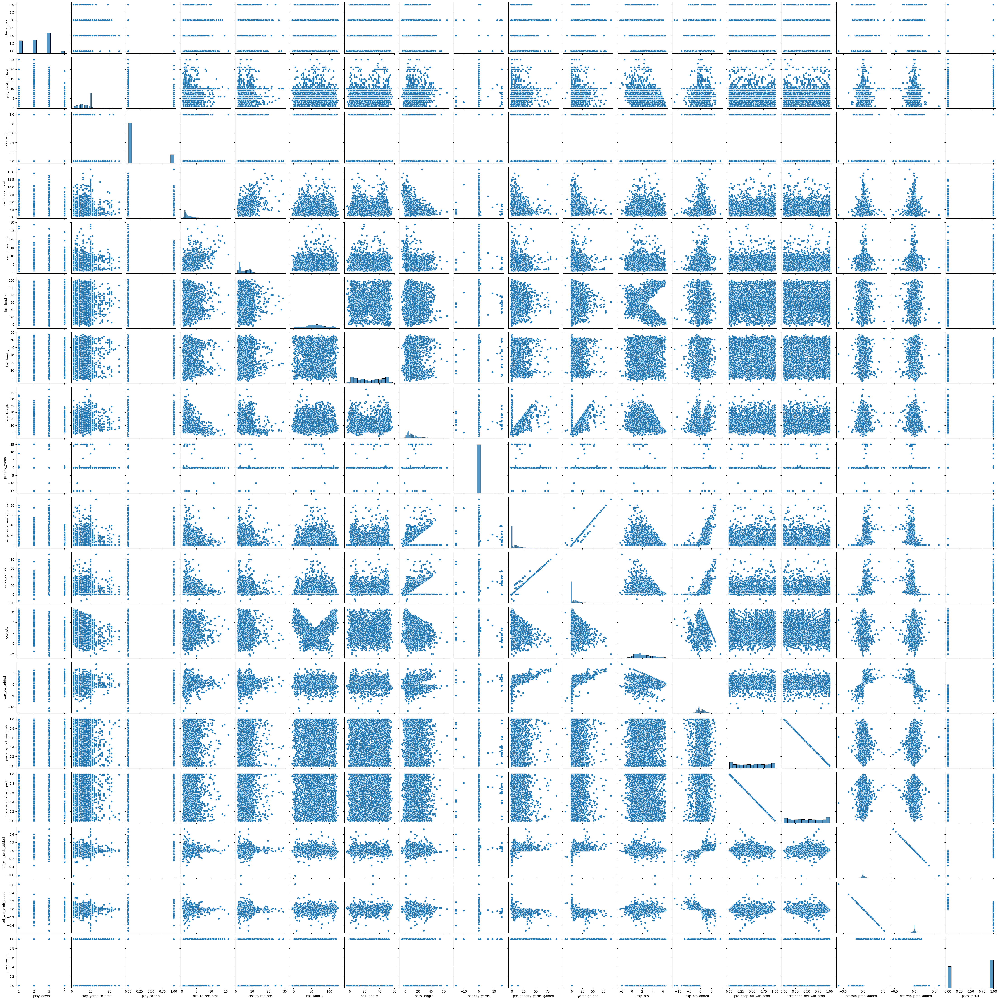

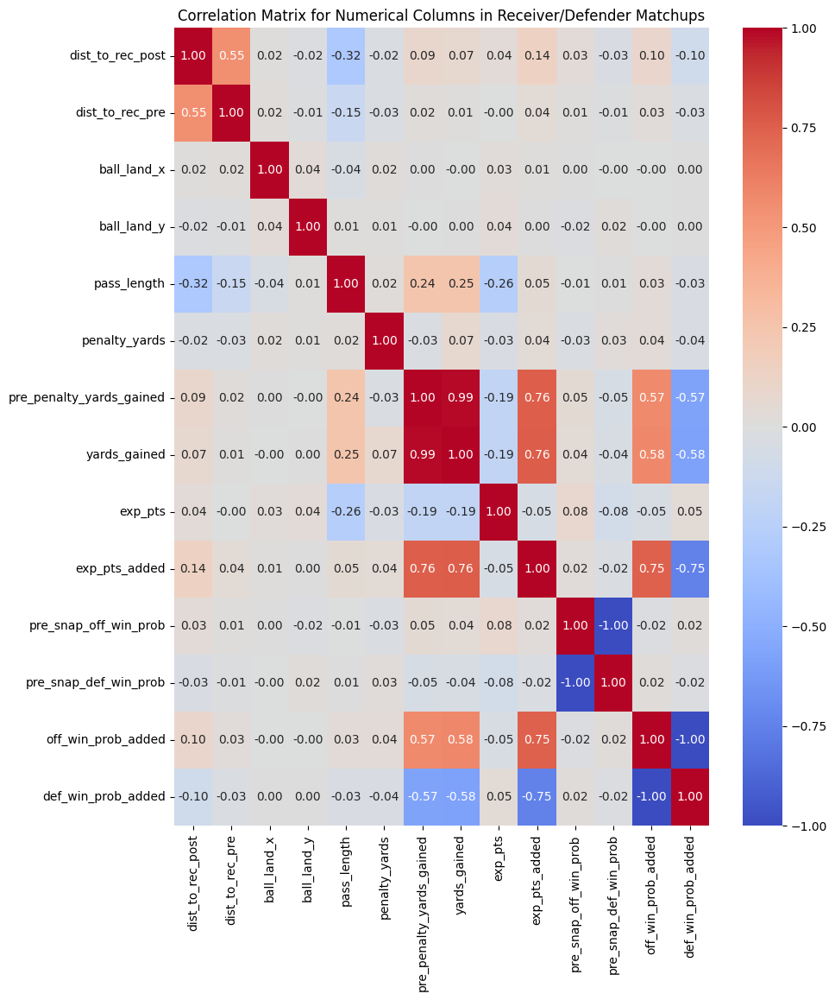

In [15]:
# Plot Type 1 (Initial EDA)

# Pairplots to assess univariate and pairwise distributions of variables
remove_cols = ['game_id', 'play_id', 'season', 'week', 'home_team_abbr', 'away_team_abbr', 'target_rec_nfl_id', 'target_rec_name', 
               'target_rec_team', 'primary_def_nfl_id', 'primary_def_name', 
               'primary_def_pos', 'primary_def_team']
num_cols_only = ['dist_to_rec_post', 'dist_to_rec_pre', 'ball_land_x', 'ball_land_y', 'pass_length', 'penalty_yards', 
                 'pre_penalty_yards_gained', 'yards_gained', 'exp_pts', 'exp_pts_added', 'pre_snap_off_win_prob', 
                 'pre_snap_def_win_prob', 'off_win_prob_added', 'def_win_prob_added'] 
cols_to_plot = [c for c in nfl_rec_def_match.columns if c not in remove_cols]
sns.pairplot(nfl_rec_def_match[cols_to_plot])


# Univariate Insights: 
    # (a) Home_win_prob_added and away_win_prob_added have roughly normal distributions with a significant number of observations centered at zero (large peak)
    # (b) Pre_snap_home_win_prob and pre_snap_away_win_prob have roughly uniform univariate distributions as well as ball_land_x and ball_land_y
    # (c) The play_action variable has significantly more observations with no play action on the play compared to play action being present on the play (imbalance)
    # (d) Pre_penalty_yards_gained and penalty_yards_gained have vvery similar shapes in their distributions except for the median being shifted for penalty_yards_gained (skewed left)
    # (e) Exp_pts has a uniform/normal distribution with a large spread in values while Exp_pts_added has a more normal distribution with a peak (mode) and more centered around a smaller range of values
    
# Bivariate/Pairwise Insights
    # (a) Pre_penalty_yards_gained and yards_gained have a strong, positive, linear relationship which may introduce multicollinearity. Therefore, only one of the variables will be required for model building.
    # (b) The same for (a) applies between the following pairs: off_win_prob_added/def_win_prob_added, pre_snap_off_win_prob/pre_snap_def_win_prob (stron, negative, linear relationship)
    # (c) Pass_length and yards_gained seem to have a moderate, positive, linear relationship 
    # (d) The relationship between ball_land_x and exp_pts seems to follow a pattern where values for ball_land_x shift to only upper and lower extremes as the exp_pts increases

# Target Variable Insights
    # (a) There is class imbalance between completed/incompleted passes. Therefore, during model building class balancing techniques must be used
    # (b) It is interesting to see that exp_pts_added can be nonzero even on potential incomplete passes
    # (c) The distribution of observations for most features against the target variable are balanced 
    # (d) Therefore, we want to feature engineer new features that can help distinguish factors between completions/incompletions

# Correlation Analysis (Correlation Matrix)
nfl_rec_def_corr = nfl_rec_def_match[num_cols_only].corr()
plt.figure(figsize=(10, 12))
sns.heatmap(nfl_rec_def_corr, annot = True, fmt = ".2f", cmap = 'coolwarm', cbar = True)
plt.title("Correlation Matrix for Numerical Columns in Receiver/Defender Matchups")
plt.show()

# Correlation Analysis Insights
    # (a) Pre_snap_off_win_prob and pre_snap_def_win_prob are perfectly correlated (r = -1.00) so drop one of these features and keep the other
    # (b) off_win_prob_added and def_win_prob_added are also perfectly correlated (r = -1.00) so drop one of these features and keep the other
    # (c) Yards_gained is strongly correlated with pre_penalty_yards_gained (drop one of the two) and also strongly correlated to exp_pts_added
    # (d) Pass_length and yards_gained have a weak, positive, linear correlation (r  = 0.26). Exp_pts_added and off_win_prob_added are also strongly correlated (r = 0.75).
    # (e) Dist_to_rec_pre and dist_to_rec_post have a positive, moderate, linear correlation (r = 0.55). Additionally, the dist_to_rec_post is weakly correlated with exp_pts_added and off_win_prob
    # (e) Many of the features in the current dataframe have very weak correlations with other features aside from the features explained in (a-d)

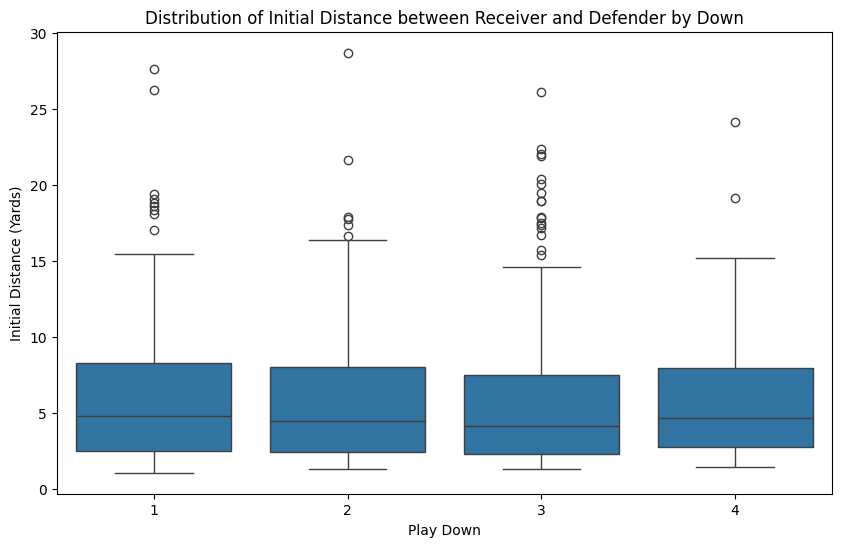

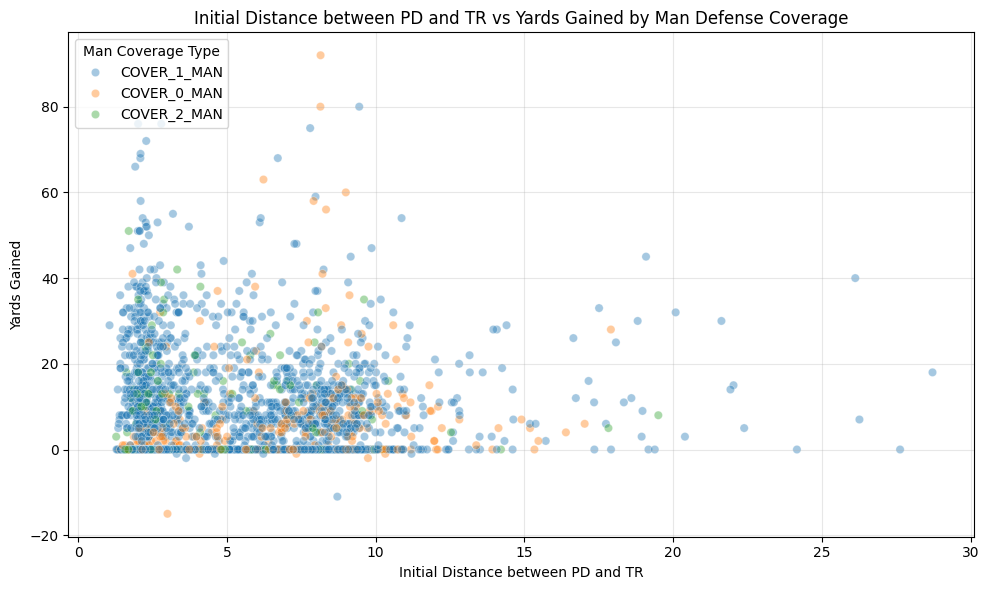

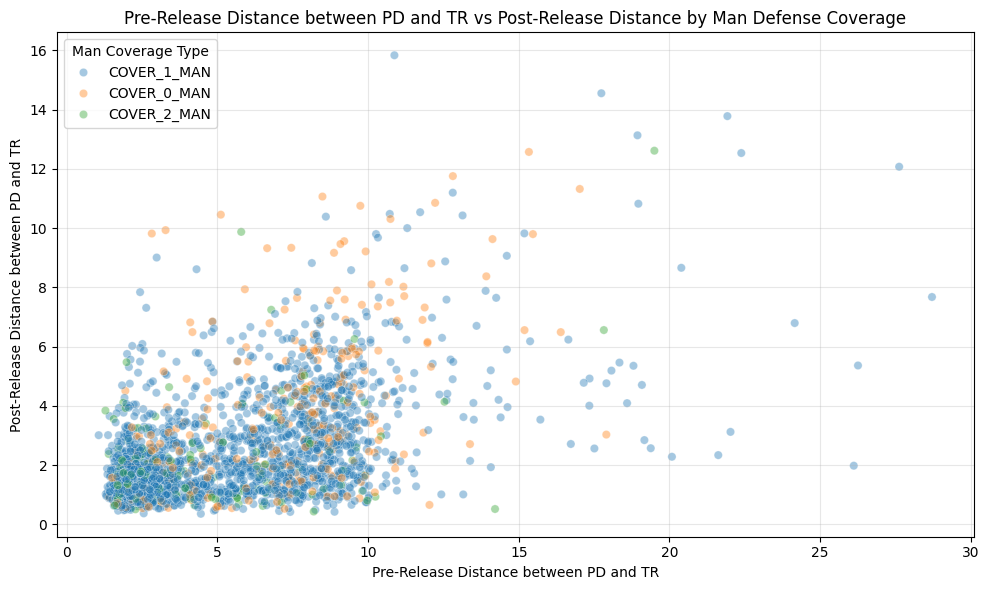

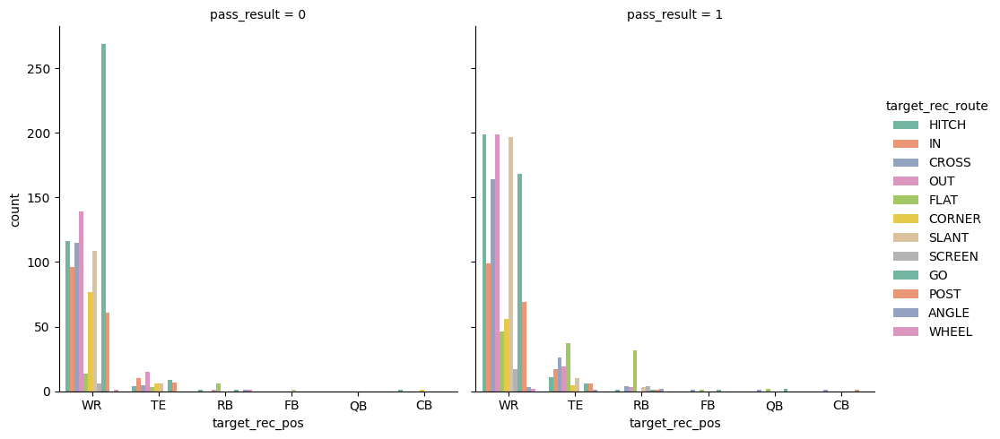

In [16]:
# Plot Type 2 (Multivariate Relationships)

# The distribution of initial distance between receiver and defender (dist_to_rec_pre) for every down (1st-4th down)
plt.figure(figsize=(10,6))
sns.boxplot(
    data = nfl_rec_def_match, 
    x = 'play_down', 
    y = 'dist_to_rec_pre'
)
plt.title('Distribution of Initial Distance between Receiver and Defender by Down')
plt.xlabel('Play Down')
plt.ylabel('Initial Distance (Yards)')
plt.show()

# Insights:
#   a) For 1st, 2nd, and 4th down, the median initial distance is approximately around 5 yards
#   b) The median initial distance decreases for 3rd down as defenders are more likely lined up closer to target receivers
#      as the required number of yards for a first down may be less. 
#   c) At the same time, for 3rd down, there are upper outliers showing that 3rd down plays may require the offense to gain more yards
#      to get the first down. Therefore, defenders will be less aggressive and line up closer to the first down marker than to the receiver.
#   d) Additionally, there are outliers for the pre-release initial distance for all downs as the primary defender after the ball is released
#      may not be the closest defender before the release of the ball. This shows that primary defenders may be help defenders in some plays.

# Initial Distance between PD & TR vs Yards Gained with respect to the Team Coverage Type
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data = nfl_rec_def_match, 
    x = 'dist_to_rec_pre',
    y = 'yards_gained', 
    hue = 'team_coverage_type', 
    alpha = 0.4
)
plt.title('Initial Distance between PD and TR vs Yards Gained by Man Defense Coverage')
plt.xlabel('Initial Distance between PD and TR')
plt.ylabel('Yards Gained')
plt.legend(title = 'Man Coverage Type', loc = 'upper left')
plt.grid(alpha = 0.3)
plt.tight_layout()
plt.show()

# Insights:
#   a) For distances between 7.5-10 yards, there have been big plays (large number of yards gained) for mostly Cover 1 Man and Cover 0 Man coverages
#   b) Cover 2 Man coverages seem to not have as many explosive plays (large number of yards gained). It seems that the initial distance between the PD and TR is
#      concentrated between 2.5 and 7.5 yards. This is because Cover 2 Man is more conservative compared to Cover 1 and Cover 2 where there are two deep safeties. 
#   c) Compared to Cover 2 Man and Cover 0 Man coverages, Cover 1 Man is played more frequently by defenses and there is a wider spread in yards gained
#      for this coverage compared to Cover 1 and Cover 0 Man coverages. This suggests that Cover 1 Man can produce crucial defensive stops while also
#      giving up explosive gains. (high risk, high reward)
#   d) The coverage with the highest risk and highest reward is Cover 0 man which is played with no deep safeties. Therefore, this coverage type tends
#      to give up huge plays while also making crucial stops. 

# Pre-Release Distance between PD & TR vs Post-Release Distance between PD & TR with respect to Team Coverage Type
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data = nfl_rec_def_match, 
    x = 'dist_to_rec_pre',
    y = 'dist_to_rec_post', 
    hue = 'team_coverage_type', 
    alpha = 0.4
)
plt.title('Pre-Release Distance between PD and TR vs Post-Release Distance by Man Defense Coverage')
plt.xlabel('Pre-Release Distance between PD and TR')
plt.ylabel('Post-Release Distance between PD and TR')
plt.legend(title = 'Man Coverage Type', loc = 'upper left')
plt.grid(alpha = 0.3)
plt.tight_layout()
plt.show()

# Insights
#   a) In Cover 1 Man coverages the post release and pre release distances are concentrated from 2-10 yards for pre-release distance
#      and 0 to 6 yards for post-release distance. Cover 1 Man has many data points where the distances between pre-release and post-release
#      increase compared to Cover 2 Man
#   b) Cover 2 Man coverage is the most conservative man coverage type leading to the post-release and pre-release distances being closer for
#      most data points as the post-release distance may be with respect to help defenders such as deep safeties. In cases such as Cover 0 Man,
#      once the target receiver creates separation, the post-release distance will be large as there will be no deep safeties for defensive support.
#   c) There are data points in Cover 1 Man where the post-release distance and pre-release distance have a significant difference. In extreme cases where
#      the post-release distance is smaller than pre-release distance, this can suggest that there was a supporting deep safety. In extreme cases where the
#      pre-release distance is smaller than the post-release distance, this suggests that the target receiver created significant separation from the defender.

# Target Receiver Position vs the Targeted Receiver's Route by the Pass Result
sns.catplot(
    data = nfl_rec_def_match, 
    kind = 'count', 
    x = 'target_rec_pos', 
    hue = 'target_rec_route', 
    col = 'pass_result', 
    palette = 'Set2'
)

# Insights 
#   a) For WRs the hitch, out, and slant routes lead to the most completions --> more efficent routes. The go routes
#      lead to the most incompletions as they are deep passes. The go routes are less efficient but are very rewarding.
#   b) For RB and TEs the flat routes are most efficient leading to the most completions as they are quick, short passes.

### **FEATURE ENGINEERING**

In [17]:
# First, create a dataframe with the game, play, target receiver, and primary defender id data
rec_def_info = nfl_rec_def_match[['game_id', 'play_id', 'target_rec_nfl_id', 'primary_def_nfl_id']]

# Create a separate entry for the target receiver and primary defender for each game id and play id combination
rec_def_info_long = rec_def_info.melt(
    id_vars = ['game_id', 'play_id'], 
    value_vars = ['target_rec_nfl_id', 'primary_def_nfl_id'], 
    var_name = 'role', 
    value_name = 'nfl_id', 
).drop(columns = 'role')

# Now merge the nfl_rec_def dataframe with the rec_def_info_long dataframe
rec_def_tracking = pd.merge(nfl_rec_def, rec_def_info_long, on = ['game_id', 'play_id', 'nfl_id'], how = 'inner')

In [18]:
# Check if the merged rec_def_tracking is consistent with nfl_rec_def_match
print(len(rec_def_tracking['player_name'].unique())) # 475
print(len(nfl_rec_def_match['target_rec_name'].unique())) # 292
print(len(nfl_rec_def_match['primary_def_name'].unique())) # 183

# The total number of unique players (475) is consistent between both data frames (good)

475
292
183


In [19]:
# Engineer features with pre-release data for simple speed, acceleraion, and direction features
pre_tracking = rec_def_tracking[rec_def_tracking['tracking'] == 'pre_release']
pre_release_features = (
    pre_tracking.groupby(['game_id', 'play_id', 'nfl_id', 'player_role'])
    .agg(
        # Pre-release speed features
        pre_max_speed = ('s', 'max'), 
        pre_avg_speed = ('s', 'mean'), 
        pre_speed_variability = ('s', 'std'), 

        # Pre-release acceleration features
        pre_max_acc = ('a', 'max'), 
        pre_avg_acc = ('a', 'mean'), 
        pre_accel_variability = ('a', 'std'),

        # Pre-release direction and orientation features
        pre_direction_variability = ('dir', 'std'),
        pre_orientation_variability = ('o', 'std')
    )
)

# Create a pivot table for the pre_release features for simple merging into the matchup table later
pre_release_pivot = pre_release_features.pivot_table(index = ['game_id', 'play_id'], columns = 'player_role', 
        values = ['pre_max_speed', 'pre_avg_speed', 'pre_speed_variability', 'pre_max_acc', 'pre_avg_acc', 
                  'pre_accel_variability', 'pre_direction_variability', 'pre_orientation_variability'
        ]                                        
)

# Flatten the columns for the pre_release features and assign the proper column names for eventual merge
col_map = {
    'Targeted Receiver' : 'REC', 
    'Defensive Coverage' : 'DB'
}

pre_release_pivot.columns = [
    f"{col_map[role]}_{metric}" for metric, role in pre_release_pivot.columns
]
pre_release_pivot = pre_release_pivot.reset_index()


# Engineer features with pre-release data for changes in distance, speed, acceleration
pre_release_change_features = (
    pre_tracking
    .sort_values(['game_id', 'play_id', 'nfl_id', 'frame_id'])
    .assign(
        change_in_x = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['x'].diff().abs(), 
        change_in_y = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['y'].diff().abs(), 
        change_in_dist = lambda df : (df['change_in_x']**2 + df['change_in_y']**2).pow(0.5),
        
        change_in_dir = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['dir'].diff().abs(),
        change_in_orientation = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['o'].diff().abs(),

        change_in_speed = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['s'].diff().abs(), 
        change_in_acceleration = lambda df : df.groupby(['game_id', 'play_id', 'nfl_id'])['a'].diff().abs()
    ).groupby(['game_id', 'play_id', 'nfl_id', 'player_role'])
    .agg(
        # Features for change in direction, orientation, speed, acceleration, and distance
        pre_max_change_in_dir = ('change_in_dir', 'max'), 
        pre_max_change_in_ori = ('change_in_orientation', 'max'),
        pre_max_change_in_speed = ('change_in_speed', 'max'), 
        pre_max_change_in_accel = ('change_in_acceleration', 'max'),
        pre_max_change_in_dist = ('change_in_dist', 'max')
    )
)

# Create a pivot table for the pre_release_change features for simple merging into the matchup table later
pre_release_change_pivot = pre_release_change_features.pivot_table(index = ['game_id', 'play_id'], columns = 'player_role', 
        values = ['pre_max_change_in_dir', 'pre_max_change_in_ori', 'pre_max_change_in_speed', 'pre_max_change_in_accel', 'pre_max_change_in_dist']                                        
)

# Flatten the columns for the pre_release_change features and assign the proper column names for eventual merge
pre_release_change_pivot.columns = [
    f"{col_map[role]}_{metric}" for metric, role in pre_release_change_pivot.columns
]
pre_release_change_pivot = pre_release_change_pivot.reset_index()

In [20]:
# Create a pivot table between the primary receiver and target defender
db_wr_pivot = pre_tracking.pivot_table(index = ['game_id', 'play_id', 'frame_id'], 
                                    columns = 'player_role', values = ['x', 'y', 'dir', 's', 'a', 'o'])

# Compress the player_role and value columns into flattened columns
db_wr_pivot.columns = [
    f'{metric}_{role.replace(' ', '')}'
    for metric, role in db_wr_pivot.columns
]

# Engineer angular features relative to one on matchups pre-release with target receiver and primary defender
db_wr_pivot = db_wr_pivot.assign(
    db_wr_separation = lambda df: (
        (df['x_TargetedReceiver'] - df['x_DefensiveCoverage'])**2 +
        (df['y_TargetedReceiver'] - df['y_DefensiveCoverage'])**2
    ).pow(0.5), 

    db_wr_angle_alignment = lambda df: (
        np.degrees(np.arctan2((df['y_TargetedReceiver'] - df['y_DefensiveCoverage']), (df['x_TargetedReceiver'] - df['x_DefensiveCoverage']))) % 360
    ), 

    db_facing_wr = lambda df: (
        (df['o_DefensiveCoverage'] - df['db_wr_angle_alignment']).abs()
    ),

    wr_motion_toward_db = lambda df: (
        (df['dir_TargetedReceiver'] - df['db_wr_angle_alignment']).abs()
    ), 

    db_wr_dir_sim = lambda df : (
        (df['dir_DefensiveCoverage'] - df['dir_TargetedReceiver']).abs()
    ),

    db_backpedal = lambda df: (
        (df['o_DefensiveCoverage'] - df['dir_DefensiveCoverage']).abs()
    ),
    
    db_wr_rel_dir = lambda df: (
        (df['dir_DefensiveCoverage'] - df['dir_TargetedReceiver']).abs()
    ), 
    
    db_wr_rel_ori = lambda df: (
        (df['o_DefensiveCoverage'] - df['o_TargetedReceiver']).abs()
    )
)

pre_release_angular_features = (
    db_wr_pivot.reset_index()
    .groupby(['game_id', 'play_id'])
    .agg(
        # Features for db and wr separation
        pre_avg_sep = ('db_wr_separation', 'mean'), 
        pre_min_sep = ('db_wr_separation', 'min'), 
        pre_sep_variability = ('db_wr_separation', 'std'), 

        # Features for DB and WR face-to-face matchups
        pre_avg_db_facing = ('db_facing_wr', 'mean'), 
        pre_min_db_facing = ('db_facing_wr', 'min'), 

        # Features for DB backpedaling
        pre_avg_db_backpedal = ('db_backpedal', 'mean'), 
        pre_max_db_backpedal = ('db_backpedal', 'max'), 

        # Features for WR motion towards DB
        pre_avg_wr_toward_db = ('wr_motion_toward_db', 'mean'), 
        pre_min_wr_toward_db = ('wr_motion_toward_db', 'min'), 
        pre_wr_db_alignment = ('db_wr_dir_sim', 'mean')
    )
)
pre_release_angular_features = pre_release_angular_features.reset_index()

In [21]:
# Engineer features with the ball in the air from the tracking data
post_tracking = rec_def_tracking[rec_def_tracking['tracking'] == 'post_release']

# Create a pivot table between the primary receiver and target defender for post_release tracking data
db_wr_pivot_post = post_tracking.pivot_table(index = ['game_id', 'play_id', 'frame_id'], 
                                    columns = 'player_role', values = ['x', 'y', 'ball_land_x', 'ball_land_y'])

# Compress the player_role and value columns into flattened columns
db_wr_pivot_post.columns = [
    f'{metric}_{role.replace(' ', '')}'
    for metric, role in db_wr_pivot_post.columns
]

db_wr_pivot_post = db_wr_pivot_post.assign(
    db_wr_separation_post = lambda df: (
        (df['x_TargetedReceiver'] - df['x_DefensiveCoverage'])**2 +
        (df['y_TargetedReceiver'] - df['y_DefensiveCoverage'])**2
    ).pow(0.5), 

    db_dist_to_ball = lambda df: ((df['ball_land_x_DefensiveCoverage'] - df['x_DefensiveCoverage'])**2 +
                                 (df['ball_land_y_DefensiveCoverage'] - df['y_DefensiveCoverage'])**2).pow(0.5),   

    wr_dist_to_ball = lambda df: ((df['ball_land_x_TargetedReceiver'] - df['x_TargetedReceiver'])**2 +
                                 (df['ball_land_y_TargetedReceiver'] - df['y_TargetedReceiver'])**2).pow(0.5), 
    
    wr_db_to_ball_dist = lambda df: df['db_dist_to_ball'] - df['wr_dist_to_ball'], 

    db_closing_rate = lambda df : -((df['db_dist_to_ball']).diff()), 
    wr_closing_rate = lambda df : -((df['wr_dist_to_ball']).diff()), 

    db_wr_sep_vel = lambda df : df['db_wr_separation_post'].diff(), 
    
    wr_burst = lambda df : np.sqrt(df['x_TargetedReceiver'].diff()**2 + df['y_TargetedReceiver'].diff()**2)
)

post_release_features = (
    db_wr_pivot_post.reset_index()
    .groupby(['game_id', 'play_id'])
    .apply(lambda df : pd.Series({

        # Features for DB and WR separation while the ball is in the air
        'post_avg_sep' : df['db_wr_separation_post'].mean(), 
        'post_min_sep' : df['db_wr_separation_post'].min(), 
        'post_max_sep' : df['db_wr_separation_post'].max(),
        'post_sep_variability' : df['db_wr_separation_post'].std(),
        'max_separation_time' : (df['db_wr_separation_post'].idxmax() - df.index.min()) / (len(df) - 1), 

        # Features for DB and WR difference for closeness to the ball at the catch point
        'post_avg_diff_to_cp' : df['wr_db_to_ball_dist'].mean(), 
        'post_min_diff_to_cp' : df['wr_db_to_ball_dist'].min(), 
        'post_diff_to_cp_variability' : df['wr_db_to_ball_dist'].std(),
        'post_max_diff_to_cp' : df['wr_db_to_ball_dist'].max(),
        'pct_db_closer_to_ball' : (df['wr_db_to_ball_dist'] < 0).mean(),
        'pct_wr_closer_to_ball' : (df['wr_db_to_ball_dist'] > 0).mean(),

        # Features for DB and WR closing rates to the ball
        'post_avg_db_closing_rate': df['db_closing_rate'].mean(),
        'post_max_db_closing_rate': df['db_closing_rate'].max(),
        'post_avg_wr_closing_rate': df['wr_closing_rate'].mean(),
        'post_max_wr_closing_rate': df['wr_closing_rate'].max(),

        # Features for DB and WR separation velocities
        'post_avg_db_wr_sep_vel': df['db_wr_sep_vel'].mean(),
        'post_min_db_wr_sep_vel': df['db_wr_sep_vel'].min(),
        'post_max_db_wr_sep_vel': df['db_wr_sep_vel'].max(),

        # Features for WR deceleration and stopping
        'wr_decels_before': (df['wr_burst'].diff() < 0).sum(),

        # Last 5 Frames Tracking Features
        'post_avg_sep_last5': df.tail(5)['db_wr_separation_post'].mean(),
        'post_min_sep_last5': df.tail(5)['db_wr_separation_post'].min(),
        'post_avg_diff_to_cp_last5': df.tail(5)['wr_db_to_ball_dist'].mean(),
        'post_avg_wr_closing_rate_last5': df.tail(5)['wr_closing_rate'].mean(),
        'post_avg_db_closing_rate_last5': df.tail(5)['db_closing_rate'].mean(),
        'post_avg_sep_vel_last5': df.tail(5)['db_wr_sep_vel'].mean()
    }))
)
post_release_features = post_release_features.reset_index()

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\276070288.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df : pd.Series({


In [22]:
# Now, join all features created into the nfl_rec_def_match_final table (create copy to maintain the original matchup table)
nfl_rec_def_match_final = nfl_rec_def_match.copy()

# First, join the pre_release angular features by game_id and play_id
nfl_rec_def_match_final = pd.merge(nfl_rec_def_match, pre_release_angular_features, 
                             on = ['game_id', 'play_id'], how = 'left')

# Next, join the post_release features by game_id and play_id
nfl_rec_def_match_final = pd.merge(nfl_rec_def_match_final, post_release_features, 
                             on = ['game_id', 'play_id'], how = 'left')

# Join the pre_release features by game_id and play_id
nfl_rec_def_match_final = pd.merge(nfl_rec_def_match_final, pre_release_pivot, 
                             on = ['game_id', 'play_id'], how = 'left')

# Join the pre_release_change features by game_id and play_id
nfl_rec_def_match_final = pd.merge(nfl_rec_def_match_final, pre_release_change_pivot, 
                             on = ['game_id', 'play_id'], how = 'left')

### **MODEL BUILDING PART 1 (LOGISTIC REGRESSION)**

In [23]:
# Map the target variable (pass_result) to a binary variable if not already done --> completed pass = 1, incomplete pass = 0
# nfl_rec_def_match_final['pass_result'] = nfl_rec_def_match_final['pass_result'].replace({'C': 1, 'I': 0, 'IN': 0})

# Store the info columns pertaining to the game, play, and players in play_info
play_info_cols = ['game_id', 'play_id', 'season', 'week', 'home_team_abbr', 'away_team_abbr', 'target_rec_nfl_id', 
                  'target_rec_name', 'target_rec_team', 'primary_def_nfl_id', 'primary_def_name', 'primary_def_team']

# Visualize the new features after feature engineering to check that they were added
nfl_rec_def_match_final.columns

Index(['game_id', 'play_id', 'season', 'week', 'home_team_abbr',
       'away_team_abbr', 'play_down', 'play_yards_to_first',
       'target_rec_nfl_id', 'target_rec_name', 'target_rec_pos',
       'target_rec_team', 'offense_formation', 'target_rec_route',
       'play_action', 'primary_def_nfl_id', 'primary_def_name',
       'primary_def_pos', 'primary_def_team', 'team_coverage_type',
       'dist_to_rec_post', 'dist_to_rec_pre', 'ball_land_x', 'ball_land_y',
       'pass_length', 'penalty_yards', 'pre_penalty_yards_gained',
       'yards_gained', 'exp_pts', 'exp_pts_added', 'pre_snap_off_win_prob',
       'pre_snap_def_win_prob', 'off_win_prob_added', 'def_win_prob_added',
       'pass_result', 'pre_avg_sep', 'pre_min_sep', 'pre_sep_variability',
       'pre_avg_db_facing', 'pre_min_db_facing', 'pre_avg_db_backpedal',
       'pre_max_db_backpedal', 'pre_avg_wr_toward_db', 'pre_min_wr_toward_db',
       'pre_wr_db_alignment', 'post_avg_sep', 'post_min_sep', 'post_max_sep',
       'po

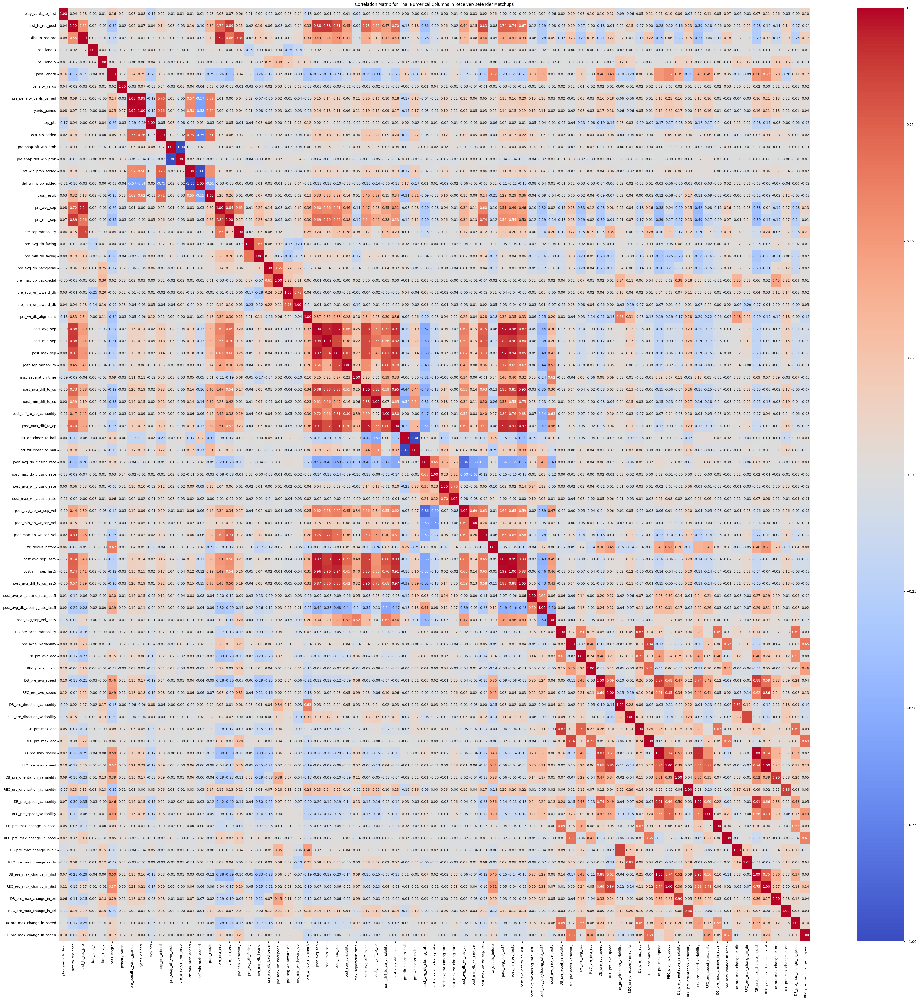

In [24]:
# Drop extra categorical variables in addition to play_info_cols for the correlation matrix
cols_to_drop = play_info_cols + ['target_rec_pos', 'offense_formation', 'target_rec_route', 'play_action', 
                                                    'primary_def_pos', 'team_coverage_type', 'play_down']
corr_cols = nfl_rec_def_match_final.drop(columns = cols_to_drop)

# Updated correlation matrix with feature engineered metrics/variables
nfl_rec_def_corr = corr_cols.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(nfl_rec_def_corr, annot = True, fmt = ".2f", cmap = 'coolwarm', cbar = True)
plt.title("Correlation Matrix for Final Numerical Columns in Receiver/Defender Matchups")
plt.show()

In [25]:
# Dummy encode categorical columns to be used in the model before model training
nfl_rec_def_match_model = nfl_rec_def_match_final.copy()
nfl_rec_def_match_model = pd.get_dummies(nfl_rec_def_match_final, columns = ['target_rec_pos', 'offense_formation',
                                                                    'target_rec_route', 'play_action', 
                                                                    'primary_def_pos', 'team_coverage_type', 
                                                                    'play_down'], drop_first = True, dtype = int)


Week_to_test: 5 

Acccuracy: 0.723
Precision: 0.782
Recall: 0.762



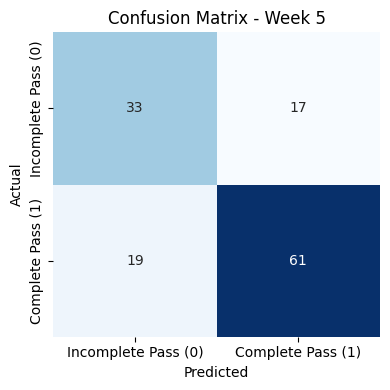

Week_to_test: 6 

Acccuracy: 0.715
Precision: 0.682
Recall: 0.738



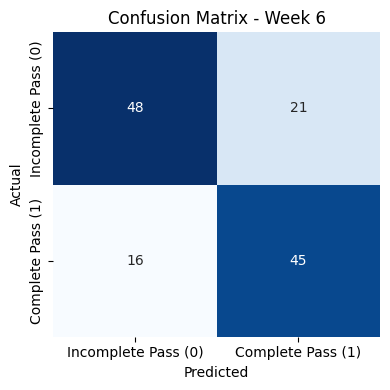

Week_to_test: 7 

Acccuracy: 0.740
Precision: 0.794
Recall: 0.740



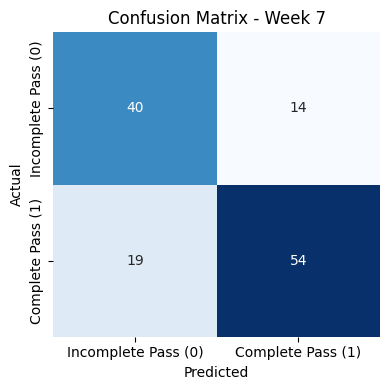

Week_to_test: 8 

Acccuracy: 0.701
Precision: 0.770
Recall: 0.720



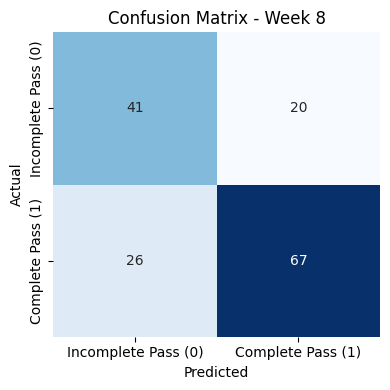

Week_to_test: 9 

Acccuracy: 0.701
Precision: 0.736
Recall: 0.736



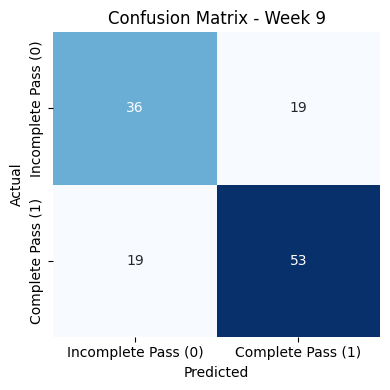

Week_to_test: 10 

Acccuracy: 0.726
Precision: 0.800
Recall: 0.658



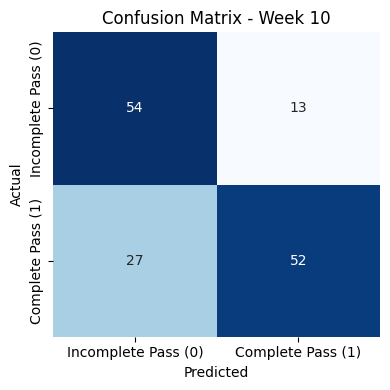

Week_to_test: 11 

Acccuracy: 0.827
Precision: 0.845
Recall: 0.831



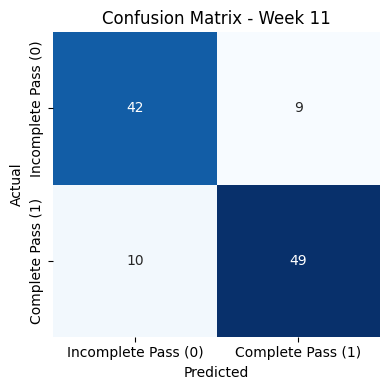

Week_to_test: 12 

Acccuracy: 0.719
Precision: 0.806
Recall: 0.731



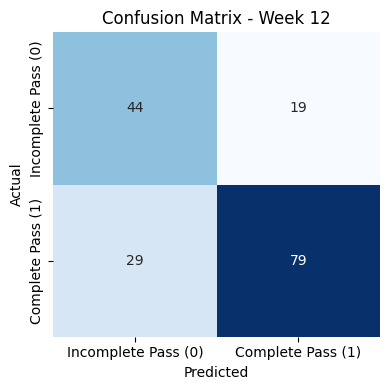

Week_to_test: 13 

Acccuracy: 0.746
Precision: 0.757
Recall: 0.757



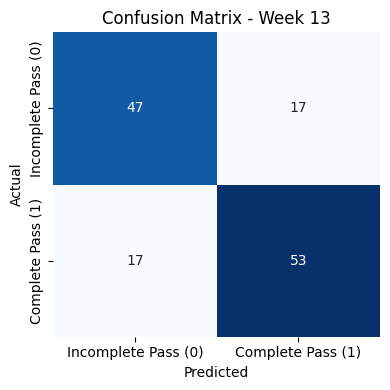

Week_to_test: 14 

Acccuracy: 0.754
Precision: 0.806
Recall: 0.711



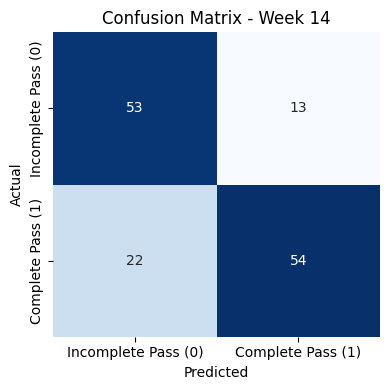

Week_to_test: 15 

Acccuracy: 0.794
Precision: 0.852
Recall: 0.754



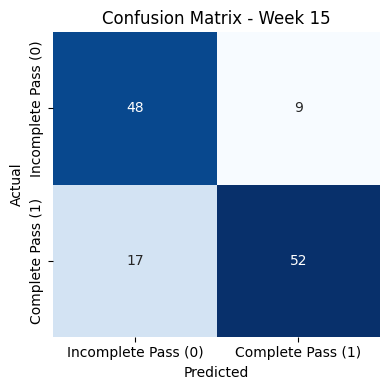

Week_to_test: 16 

Acccuracy: 0.720
Precision: 0.744
Recall: 0.744



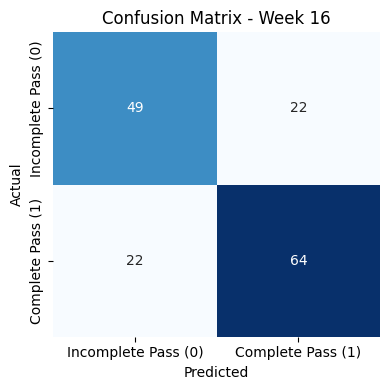

Week_to_test: 17 

Acccuracy: 0.725
Precision: 0.764
Recall: 0.714



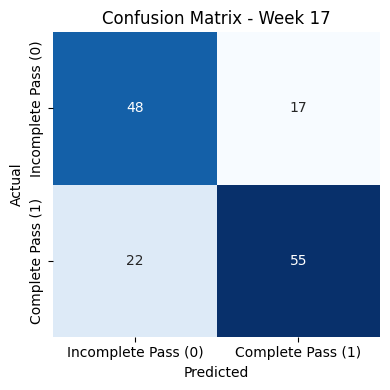

Week_to_test: 18 

Acccuracy: 0.664
Precision: 0.745
Recall: 0.603



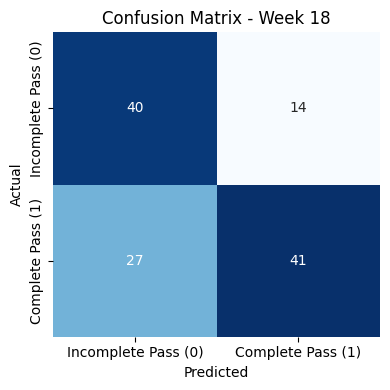



Final Performance and Confusion Matrix
Brier Score: 0.182653
ROC_AUC: 0.800433
Accuracy: 0.730970
Precision:0.776670
Recall:0.727358
F1 Score:0.751205


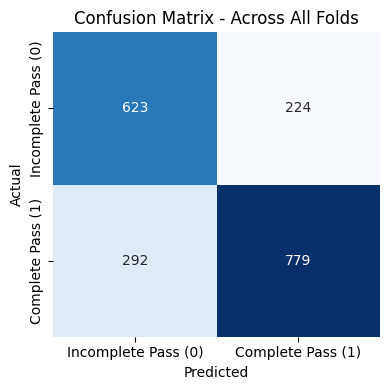

Feature Importances (Top 10 Features)
feature
post_avg_diff_to_cp_last5    1.615937
post_min_sep_last5           1.296492
post_avg_sep_vel_last5       0.851266
post_avg_sep_last5           0.795511
pre_avg_sep                  0.605425
post_avg_sep                 0.569717
post_avg_db_wr_sep_vel       0.428287
post_max_db_wr_sep_vel       0.417815
post_max_sep                 0.376873
REC_pre_avg_speed            0.368967
Name: coefficient, dtype: float64


In [26]:
# Build the Logistic Regression Model with Temporal Sliding Validation
# The data consists of weeks 1-18 of the 2023 season 
#   Ex: Train weeks 1-4, test week 5 | Train weeks 1-5, test week 6 | ... | Train weeks 1-17, test week 18

# Start the sliding window validation from week 4
week_to_start = 4
week_to_end = len(nfl_rec_def_match_model['week'].unique())

# Determine the target variable (pass_result)
target_var = 'pass_result'

# Determine the columns that should be features in the model
#   Remove columns that may present data leakage as well as play information cols
data_leakage_vars = ['exp_pts_added', 'off_win_prob_added', 'def_win_prob_added', 
                     'pre_snap_def_win_prob', 'pre_snap_off_win_prob', 'ball_land_x', 
                     'ball_land_y', 'yards_gained', 'pre_penalty_yards_gained']
remove_cols_model = play_info_cols + data_leakage_vars
feature_vars = [c for c in nfl_rec_def_match_model.columns if c not in remove_cols_model + [target_var]]

# Store the y_preds, y_test across all temporal sliding windows
y_preds_store = []
y_test_store = []
y_probs_store = []
lr_coef_store = []

# For loop to implement the temporal sliding window starting from week 4 of the 2023 season
for week_to_test in range(week_to_start + 1, week_to_end + 1):
    # The train data consists of the data in the past weeks before week_to_test
    train_data = nfl_rec_def_match_model[nfl_rec_def_match_model['week'] < week_to_test]
    # The test data consists of the data for the week to test
    test_data = nfl_rec_def_match_model[nfl_rec_def_match_model['week'] == week_to_test]

    # Define the training/testing data with x_train having the features and y_train having the target as pass_result
    x_train = train_data[feature_vars]
    y_train = train_data[target_var]

    x_test = test_data[feature_vars]
    y_test = test_data[target_var]

    y_test_store.append(y_test)

    # For Logistic Regression, we will use regularization, therefore it is important to standardize the data
    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)

    # There is class imbalance in the dataset, 1418 obs are 1 (complete catch), 1082 are 0 (incomplete catch)
    # We include class weighting to account for this slight imbalance
    classes = np.unique(y_train)
    class_weights_array = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
    class_weights = dict(zip(classes, class_weights_array))

    # Fit the logistic regression with ridge regression penalty
    model = LogisticRegression(penalty='l2', solver='liblinear', class_weight=class_weights)
    model.fit(x_train_scaled, y_train)

    # Make the predictions on x_test_scaled using the logistic regression model
    y_pred = model.predict(x_test_scaled)
    y_preds_store.append(y_pred)
    
    # Extract the probabilities from the logistic regression model
    y_pred_prob = model.predict_proba(x_test_scaled)[:, 1]
    y_probs_store.append(y_pred_prob)

    # Calculate metrics from the LR model for every window
    brier = brier_score_loss(y_test, y_pred_prob)
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    print(f'Week_to_test: {week_to_test} \n\nAcccuracy: {acc:.3f}')
    print(f'Precision: {prec:.3f}')
    print(f'Recall: {recall:.3f}\n')

    # Plot confusion matrix for every temporal window fold
    plt.figure(figsize = (4,4))
    sns.heatmap(cm, annot = True, cmap = 'Blues', cbar = False, 
                xticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'], 
                yticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - Week {week_to_test}')
    plt.tight_layout()
    plt.show()

    # Pull the coefficients from the LR model to analyze feature importance
    lr_coef = model.coef_[0]
    lr_coef_store.append(pd.DataFrame({
        'feature': feature_vars,
        'coefficient': lr_coef,
        'test_week': week_to_test
    }))

    # Combine all folds
    lr_coef_df = pd.concat(lr_coef_store, ignore_index=True)

# Calculate the Metrics for Accuracy, Precision, Recall, and F1 from all folds
y_test_all = np.concatenate(y_test_store)
y_pred_all = np.concatenate(y_preds_store)
y_prob_all = np.concatenate(y_probs_store)

print('\n')
print('Final Performance and Confusion Matrix')

brier = brier_score_loss(y_test_all, y_prob_all)
roc_auc = roc_auc_score(y_test_all, y_prob_all)
acc = accuracy_score(y_test_all, y_pred_all)
prec = precision_score(y_test_all, y_pred_all)
recall = recall_score(y_test_all, y_pred_all)
f1 = f1_score(y_test_all, y_pred_all)

# Display all of the evaluatiion metrics across all folds combined
print(f'Brier Score: {brier:3f}')
print(f'ROC_AUC: {roc_auc:3f}')
print(f'Accuracy: {acc:3f}')
print(f'Precision:{prec:3f}')
print(f'Recall:{recall:3f}')
print(f'F1 Score:{f1:3f}')

# Plot confusion matrix across all folds combined
cm_final = confusion_matrix(y_test_all, y_pred_all)
plt.figure(figsize = (4,4))
sns.heatmap(cm_final, annot = True, fmt = 'd', cmap = 'Blues', cbar = False, 
            xticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'], 
            yticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix - Across All Folds')
plt.tight_layout()
plt.show()

# Display the average LR coefficient across folds (feature importances for top 10 features)
print('Feature Importances (Top 10 Features)')
avg_importance = lr_coef_df.groupby('feature')['coefficient'].apply(lambda x: np.mean(np.abs(x))).sort_values(ascending=False)
print(avg_importance.head(10)) 


### **MODEL BUILDING PART 2 (RANDOM FOREST)**

In [27]:
# Logistic Regression model was fit for interpretation to get an understanding of feature importances and
#   the implementation of temporal sliding window validation 

# Next, with Random Forest, we will be creating a hypertuned model with a slightly different approach to 
#   build upon the predictive performance of Logistic Regression

# Plan: 
#   There are 18 weeks of NFL matchup data between receivers and defenders (drop Week 18 due to rest, injuries, playoff prep)
#   The training set will be weeks 1-11 and the testing set will be weeks 12-17
#   For the training set, we will implement time series cross validation with the following procedure for every hyperparam set: 
#       (1) Train: W 1-3, Val W 4
#       (2) Train: W 1-4, Val W 5
#       (3) Train: W 1-5, Val W 6
#       (4) Train: W 1-6, Val W 7
#       (5) Train: W 1-7, Val W 8
#       (6) Train: W 1-8, Val W 9
#       (7) Train: W 1-9, Val W 10
#       (8) Train: W 1-10, Val W 11
#    The best hyperparam set will be the one with the best performance (Accuracy, Precision, Recall, F1, AUC, etc.. ) across all folds
#    After determining the best hyperparam set, train the entire model with this hyperparam set on Weeks 1-11, and finally test on Weeks 12-17.

# Split the nfl_rec_def_match_final dataset into training (weeks 1-11) and testing (weeks 12-17) sets
nfl_match_train = nfl_rec_def_match_model[nfl_rec_def_match_model['week'] <= 11]
nfl_match_test = nfl_rec_def_match_model[nfl_rec_def_match_model['week'] >= 12]

In [ ]:
# Define the Random Forest Hypertuning Parameter Grid
param_grid = {
    "n_estimators": [200, 500, 1000], 
    "max_depth" : [8, 12, 16], 
    'min_samples_split' : [5, 10], 
    'min_samples_leaf': [1, 2, 4], 
    'max_features' : ['sqrt']
}

# Store all of the possible hyperparameter combinations
param_comb = list(itertools.product(
    param_grid['n_estimators'], 
    param_grid['max_depth'], 
    param_grid['min_samples_split'], 
    param_grid['min_samples_leaf'], 
    param_grid['max_features']
))

# In the case with RF cross validation, week_to_end = 11 (final week in training set)
week_to_end = 11
cv_results = []

for param_set in param_comb:
    n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features = param_set
    params = {
        'n_estimators': n_estimators, 
        'max_depth' : max_depth, 
        'min_samples_split' : min_samples_split, 
        'min_samples_leaf': min_samples_leaf, 
        'max_features' : max_features, 
        'random_state' : 30
    }

    print(f"Evaluating param set: n_estimators={n_estimators}, max_depth={max_depth}, min_samples_split={min_samples_split}, min_samples_leaf={min_samples_leaf}, max_features={max_features}")

    y_actual_store_rf = []
    y_pred_store_rf = []
    y_probs_store_rf = []

    for week_to_test in range(week_to_start, week_to_end + 1):
        print(f"  Fold week {week_to_test}: train weeks < {week_to_test}, val week {week_to_test}")
        # Define the training and validation data based on the weeks to be trained and validated
        cv_train_fold = nfl_match_train[nfl_match_train['week'] < week_to_test]
        cv_val_fold = nfl_match_train[nfl_match_train['week'] == week_to_test]

        # Create the training and validation setes for building the model
        x_train_cv = cv_train_fold[feature_vars]
        x_val_cv = cv_val_fold[feature_vars]

        y_train_cv = cv_train_fold[target_var]
        y_val_cv = cv_val_fold[target_var]

        # Perform class balancing
        classes = np.unique(y_train_cv)
        class_weights_array = compute_class_weight(class_weight='balanced', classes=classes, y=y_train_cv)
        class_weights = dict(zip(classes, class_weights_array))

        # Fit the Random Forest Model on the x_train_cv and y_train_cv
        rf_model = RandomForestClassifier(**params, class_weight = class_weights)
        rf_model.fit(x_train_cv, y_train_cv)

        # Extract the probs and make predictions witht the trained model
        y_preds_rf = rf_model.predict(x_val_cv)
        y_probs_rf = rf_model.predict_proba(x_val_cv)[:, 1]

        # Store the predictions from the fold
        y_actual_store_rf.append(y_val_cv)
        y_pred_store_rf.append(y_preds_rf)
        y_probs_store_rf.append(y_probs_rf)

    # Concatenate the y_actual_store, y_pred_store, y_prob_store from all folds
    y_actual = np.concatenate(y_actual_store_rf)
    y_pred = np.concatenate(y_pred_store_rf)
    y_prob = np.concatenate(y_probs_store_rf)
    
    # Evaluate metrics for each hypertuning parameter
    brier = brier_score_loss(y_actual, y_prob)
    acc = accuracy_score(y_actual, y_pred)
    prec = precision_score(y_actual, y_pred)
    recall = recall_score(y_actual, y_pred)
    f1 = f1_score(y_actual, y_pred)
    roc_auc = roc_auc_score(y_actual, y_prob)

    # Add the evaluation results to the cv_results list with the parameters
    cv_results.append({
        'params': params, 
        'brier' : brier, 
        'accuracy' : acc, 
        'precision' : prec, 
        'recall' : recall, 
        'f1' : f1, 
        'AUC' : roc_auc
    })

Evaluating param set: n_estimators=200, max_depth=8, min_samples_split=5, min_samples_leaf=1, max_features=sqrt
  Fold week 4: train weeks < 4, val week 4
  Fold week 5: train weeks < 5, val week 5
  Fold week 6: train weeks < 6, val week 6
  Fold week 7: train weeks < 7, val week 7
  Fold week 8: train weeks < 8, val week 8
  Fold week 9: train weeks < 9, val week 9
  Fold week 10: train weeks < 10, val week 10
  Fold week 11: train weeks < 11, val week 11
Evaluating param set: n_estimators=200, max_depth=8, min_samples_split=5, min_samples_leaf=2, max_features=sqrt
  Fold week 4: train weeks < 4, val week 4
  Fold week 5: train weeks < 5, val week 5
  Fold week 6: train weeks < 6, val week 6
  Fold week 7: train weeks < 7, val week 7
  Fold week 8: train weeks < 8, val week 8
  Fold week 9: train weeks < 9, val week 9
  Fold week 10: train weeks < 10, val week 10
  Fold week 11: train weeks < 11, val week 11
Evaluating param set: n_estimators=200, max_depth=8, min_samples_split=5, mi

In [49]:
# Determine the best set of hyperparameters (use F1)
cv_results = sorted(cv_results, key = lambda x: x['f1'], reverse = True)
best_params = cv_results[0]['params']
best_model_info = cv_results[0]
print("Best Performing Hyperparams", best_model_info)

Best Performing Hyperparams {'params': {'n_estimators': 200, 'max_depth': 12, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'random_state': 30}, 'brier': 0.1709862544736464, 'accuracy': 0.7768199233716475, 'precision': 0.7943615257048093, 'recall': 0.814625850340136, 'f1': 0.8043660789252729, 'AUC': 0.8211413951545531}


In [50]:
cv_results

[{'params': {'n_estimators': 200,
   'max_depth': 12,
   'min_samples_split': 10,
   'min_samples_leaf': 2,
   'max_features': 'sqrt',
   'random_state': 30},
  'brier': 0.1709862544736464,
  'accuracy': 0.7768199233716475,
  'precision': 0.7943615257048093,
  'recall': 0.814625850340136,
  'f1': 0.8043660789252729,
  'AUC': 0.8211413951545531},
 {'params': {'n_estimators': 500,
   'max_depth': 16,
   'min_samples_split': 5,
   'min_samples_leaf': 2,
   'max_features': 'sqrt',
   'random_state': 30},
  'brier': 0.17021187614540248,
  'accuracy': 0.7720306513409961,
  'precision': 0.782258064516129,
  'recall': 0.8248299319727891,
  'f1': 0.8029801324503312,
  'AUC': 0.8236178243227116},
 {'params': {'n_estimators': 500,
   'max_depth': 16,
   'min_samples_split': 5,
   'min_samples_leaf': 1,
   'max_features': 'sqrt',
   'random_state': 30},
  'brier': 0.17148626823674384,
  'accuracy': 0.7691570881226054,
  'precision': 0.7749603803486529,
  'recall': 0.8316326530612245,
  'f1': 0.802

Final Heldout Test Metrics (Random Forest):
Brier: 0.18194614377957644
Accuracy: 0.7404426559356136
Precision: 0.7624113475177305
Recall: 0.776173285198556
F1: 0.7692307692307693
AUC 0.7953889071217591


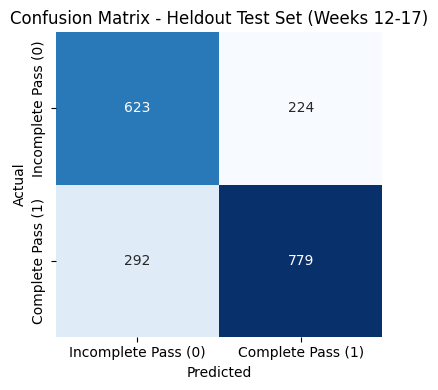

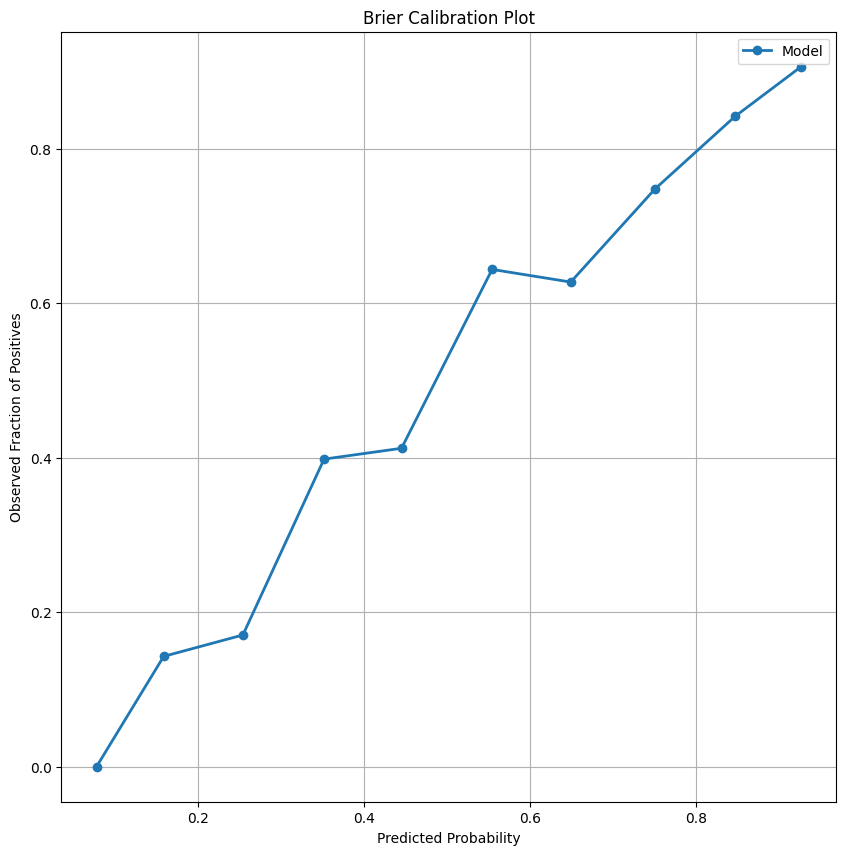

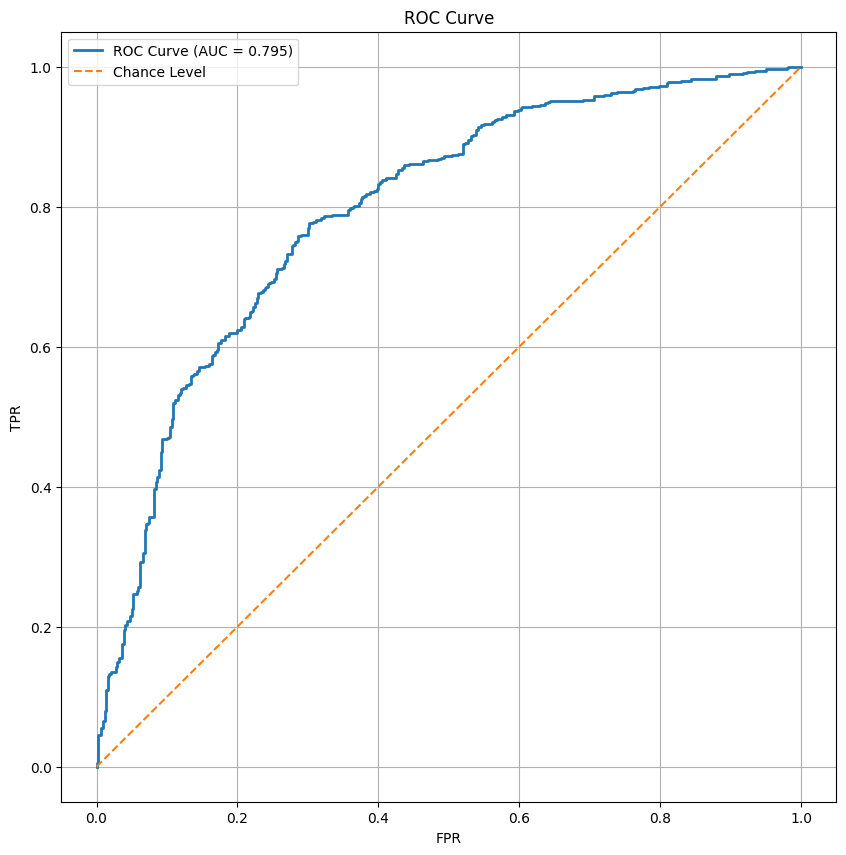

In [28]:
# Fit the best hyperparameters to the entire training set and evaluate on the heldout test set

best_params = {'n_estimators': 200, 'max_depth': 12, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'random_state': 30}

rf_model_best = RandomForestClassifier(**best_params, class_weight = 'balanced')

x_train_full = nfl_match_train[feature_vars]
x_test_full = nfl_match_test[feature_vars]
y_train_full = nfl_match_train[target_var]
y_test_full = nfl_match_test[target_var]

rf_model_best.fit(x_train_full, y_train_full)
y_pred_full_rf = rf_model_best.predict(x_test_full)
y_prob_full_rf = rf_model_best.predict_proba(x_test_full)[:, 1]

# Calculate evaluation metrics with respect to the heldout test set
brier_heldout = brier_score_loss(y_test_full, y_prob_full_rf)
acc_heldout = accuracy_score(y_test_full, y_pred_full_rf)
prec_heldout = precision_score(y_test_full, y_pred_full_rf)
recall_heldout = recall_score(y_test_full, y_pred_full_rf)
f1_heldout = f1_score(y_test_full, y_pred_full_rf)
roc_auc_heldout = roc_auc_score(y_test_full, y_prob_full_rf)

print("Final Heldout Test Metrics (Random Forest):")
print("Brier:", brier_heldout)
print("Accuracy:", acc_heldout)
print("Precision:", prec_heldout)
print("Recall:", recall_heldout)
print("F1:", f1_heldout)
print("AUC", roc_auc_heldout)

# Plot the confusion matrix for the evaluation on the heldout test set
cm_heldout = confusion_matrix(y_pred_full_rf, y_test_full)
plt.figure(figsize = (4,4))
sns.heatmap(cm_final, annot = True, fmt = 'd', cmap = 'Blues', cbar = False, 
            xticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'], 
            yticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix - Heldout Test Set (Weeks 12-17)')
plt.tight_layout()
plt.show()

# Plot a brier calibration curve 
prob_true, prob_pred = calibration_curve(y_test_full, y_prob_full_rf, n_bins=10)
plt.figure(figsize=(10, 10))
plt.plot(prob_pred, prob_true, marker = 'o', linewidth = 2, label = 'Model')
plt.xlabel('Predicted Probability')
plt.ylabel('Observed Fraction of Positives')
plt.title('Brier Calibration Plot')
plt.legend()
plt.grid(True)
plt.show()

# Plot an ROC Curve (TPR vs FPR)
fpr, tpr, thresholds = roc_curve(y_test_full, y_prob_full_rf)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 10))
plt.plot(fpr, tpr, linewidth=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], linestyle='--', label='Chance Level')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

In [52]:
# Feature Importance from the Random Forest Models
feature_importance_rf = pd.DataFrame({
    'feature':feature_vars, 
    'importance_score': rf_model_best.feature_importances_
}).sort_values('importance_score', ascending = False)

print(feature_importance_rf.head(10))

                      feature  importance_score
37  post_avg_diff_to_cp_last5          0.050558
17               post_min_sep          0.049536
21        post_avg_diff_to_cp          0.047794
22        post_min_diff_to_cp          0.047454
16               post_avg_sep          0.040929
24        post_max_diff_to_cp          0.037700
35         post_avg_sep_last5          0.031528
29   post_avg_wr_closing_rate          0.030079
1            dist_to_rec_post          0.029629
25      pct_db_closer_to_ball          0.024696


### **MODEL BUILDING PART 3 (XGBOOST)**

In [53]:
# Define the XGBoost Hypertuning Parameter Grid
param_grid_xgb = {
    'n_estimators': [500, 1000], 
    'max_depth' : [6, 9, 12], 
    'learning_rate' : [0.05, 0.1],
    'min_child_weight': [1, 5], 
    'subsample' : [0.7, 1.0], 
    'colsample_bytree' : [0.7, 1.0],
    'gamma' : [0, 1], 
    'reg_lambda': [1.0], 
    'reg_alpha' : [1.0]
}

# Store all of the possible hyperparameter combinations
param_comb_xgb = list(itertools.product(
    param_grid_xgb['n_estimators'],
    param_grid_xgb['max_depth'], 
    param_grid_xgb['learning_rate'], 
    param_grid_xgb['min_child_weight'], 
    param_grid_xgb['subsample'],
    param_grid_xgb['colsample_bytree'], 
    param_grid_xgb['gamma'], 
    param_grid_xgb['reg_lambda'], 
    param_grid_xgb['reg_alpha']
))

# In the case with RF cross validation, week_to_end = 11 (final week in training set)
week_to_end = 11
cv_results_xgb = []

for param_set in param_comb_xgb:
    n_estimators, max_depth, learning_rate, min_child_weight, subsample, colsample_bytree, gamma, reg_lambda, reg_alpha = param_set
    params = {
        'n_estimators': n_estimators, 
        'max_depth' : max_depth, 
        'learning_rate' : learning_rate, 
        'min_child_weight' : min_child_weight, 
        'subsample' : subsample, 
        'colsample_bytree': colsample_bytree, 
        'gamma' : gamma, 
        'reg_lambda' : reg_lambda, 
        'reg_alpha' : reg_alpha,
        'random_state' : 30
    }

    print(f"Evaluating param set: n_estimators={n_estimators}, max_depth={max_depth}, learning_rate={learning_rate}, min_child_weight={min_child_weight}, subsample={subsample}, colsample_bytree={colsample_bytree}, gamma={gamma}, reg_lambda={reg_lambda}, reg_alpha={reg_alpha}")

    y_actual_store_xgb = []
    y_pred_store_xgb = []
    y_probs_store_xgb = []

    for week_to_test in range(week_to_start, week_to_end + 1):
        print(f"  Fold week {week_to_test}: train weeks < {week_to_test}, val week {week_to_test}")
        # Define the training and validation data based on the weeks to be trained and validated
        cv_train_fold = nfl_match_train[nfl_match_train['week'] < week_to_test]
        cv_val_fold = nfl_match_train[nfl_match_train['week'] == week_to_test]

        # Create the training and validation setes for building the model
        x_train_cv = cv_train_fold[feature_vars]
        x_val_cv = cv_val_fold[feature_vars]

        y_train_cv = cv_train_fold[target_var]
        y_val_cv = cv_val_fold[target_var]

        # Perform class balancing
        scale_pos_weight = sum(y_train_cv == 0) / sum(y_train_cv == 1)

        # Fit the Random Forest Model on the x_train_cv and y_train_cv
        xgb_model = XGBClassifier(**params, scale_pos_weight = scale_pos_weight, use_label_encoder = False, eval_metric = 'logloss')
        xgb_model.fit(x_train_cv, y_train_cv)

        # Extract the probs and make predictions witht the trained model
        y_preds_xgb = xgb_model.predict(x_val_cv)
        y_probs_xgb = xgb_model.predict_proba(x_val_cv)[:, 1]

        # Store the predictions from the fold
        y_actual_store_xgb.append(y_val_cv)
        y_pred_store_xgb.append(y_preds_xgb)
        y_probs_store_xgb.append(y_probs_xgb)

    # Concatenate the y_actual_store, y_pred_store, y_prob_store from all folds
    y_actual = np.concatenate(y_actual_store_xgb)
    y_pred = np.concatenate(y_pred_store_xgb)
    y_prob = np.concatenate(y_probs_store_xgb)
    
    # Evaluate metrics for each hypertuning parameter
    brier = brier_score_loss(y_actual, y_prob)
    acc = accuracy_score(y_actual, y_pred)
    prec = precision_score(y_actual, y_pred)
    recall = recall_score(y_actual, y_pred)
    f1 = f1_score(y_actual, y_pred)
    roc_auc = roc_auc_score(y_actual, y_prob)

    # Add the evaluation results to the cv_results list with the parameters
    cv_results_xgb.append({
        'params': params, 
        'brier' : brier, 
        'accuracy' : acc, 
        'precision' : prec, 
        'recall' : recall, 
        'f1' : f1, 
        'AUC' : roc_auc
    })

Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:06:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:07:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:08:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:09:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:10:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:11:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:12:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:13:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:14:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:15:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:16:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:17:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:18:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:19:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:20:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:21:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:22:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:23:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:24:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:25:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:26:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=500, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:27:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:28:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:29:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:30:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:31:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:32:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:33:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:34:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:35:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:36:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:37:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:38:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:39:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:40:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:41:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:42:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=6, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:43:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:44:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:45:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:46:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:47:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:48:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:49:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:50:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:51:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:52:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:53:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:54:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:55:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=9, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:56:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:57:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:58:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [20:59:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:00:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:01:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:02:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.05, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:03:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:04:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:05:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:19] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=1, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:06:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:28] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:07:58] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=0.7, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:08:59] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=0.7, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=0, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating param set: n_estimators=1000, max_depth=12, learning_rate=0.1, min_child_weight=5, subsample=1.0, colsample_bytree=1.0, gamma=1, reg_lambda=1.0, reg_alpha=1.0
  Fold week 4: train weeks < 4, val week 4


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 5: train weeks < 5, val week 5


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 6: train weeks < 6, val week 6


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 7: train weeks < 7, val week 7


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 8: train weeks < 8, val week 8


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 9: train weeks < 9, val week 9


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 10: train weeks < 10, val week 10


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


  Fold week 11: train weeks < 11, val week 11


c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:09:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [54]:
# Determine the best set of hyperparameters for XGBoost (use F1)
cv_results_xgb = sorted(cv_results_xgb, key = lambda x: x['f1'], reverse = True)
best_params_xgb = cv_results_xgb[0]['params']
best_model_info_xgb = cv_results_xgb[0]
print("Best Performing Hyperparams", best_model_info_xgb)

Best Performing Hyperparams {'params': {'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.1, 'min_child_weight': 5, 'subsample': 1.0, 'colsample_bytree': 0.7, 'gamma': 0, 'reg_lambda': 1.0, 'reg_alpha': 1.0, 'random_state': 30}, 'brier': 0.18018483264219828, 'accuracy': 0.7653256704980843, 'precision': 0.7806873977086743, 'recall': 0.8112244897959183, 'f1': 0.7956630525437864, 'AUC': 0.8132682897720492}


In [55]:
cv_results_xgb

[{'params': {'n_estimators': 500,
   'max_depth': 12,
   'learning_rate': 0.1,
   'min_child_weight': 5,
   'subsample': 1.0,
   'colsample_bytree': 0.7,
   'gamma': 0,
   'reg_lambda': 1.0,
   'reg_alpha': 1.0,
   'random_state': 30},
  'brier': 0.18018483264219828,
  'accuracy': 0.7653256704980843,
  'precision': 0.7806873977086743,
  'recall': 0.8112244897959183,
  'f1': 0.7956630525437864,
  'AUC': 0.8132682897720492},
 {'params': {'n_estimators': 1000,
   'max_depth': 12,
   'learning_rate': 0.1,
   'min_child_weight': 5,
   'subsample': 1.0,
   'colsample_bytree': 0.7,
   'gamma': 0,
   'reg_lambda': 1.0,
   'reg_alpha': 1.0,
   'random_state': 30},
  'brier': 0.18018483264219828,
  'accuracy': 0.7653256704980843,
  'precision': 0.7806873977086743,
  'recall': 0.8112244897959183,
  'f1': 0.7956630525437864,
  'AUC': 0.8132682897720492},
 {'params': {'n_estimators': 1000,
   'max_depth': 9,
   'learning_rate': 0.1,
   'min_child_weight': 1,
   'subsample': 0.7,
   'colsample_bytre

c:\Users\Sarvesh\anaconda3\envs\NBACluster\Lib\site-packages\xgboost\training.py:183: UserWarning: [03:02:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Final Heldout Test Metrics (XGBoost):
Brier: 0.188439330834811
Accuracy: 0.7464788732394366
Precision: 0.757679180887372
Recall: 0.8014440433212996
F1: 0.7789473684210526
AUC 0.8066725467673121


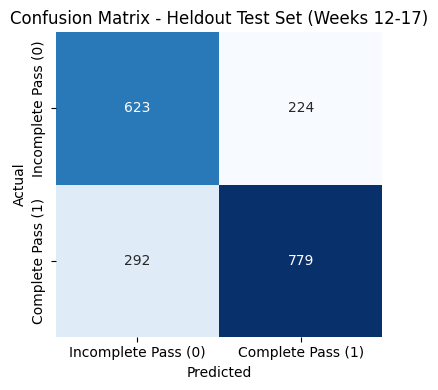

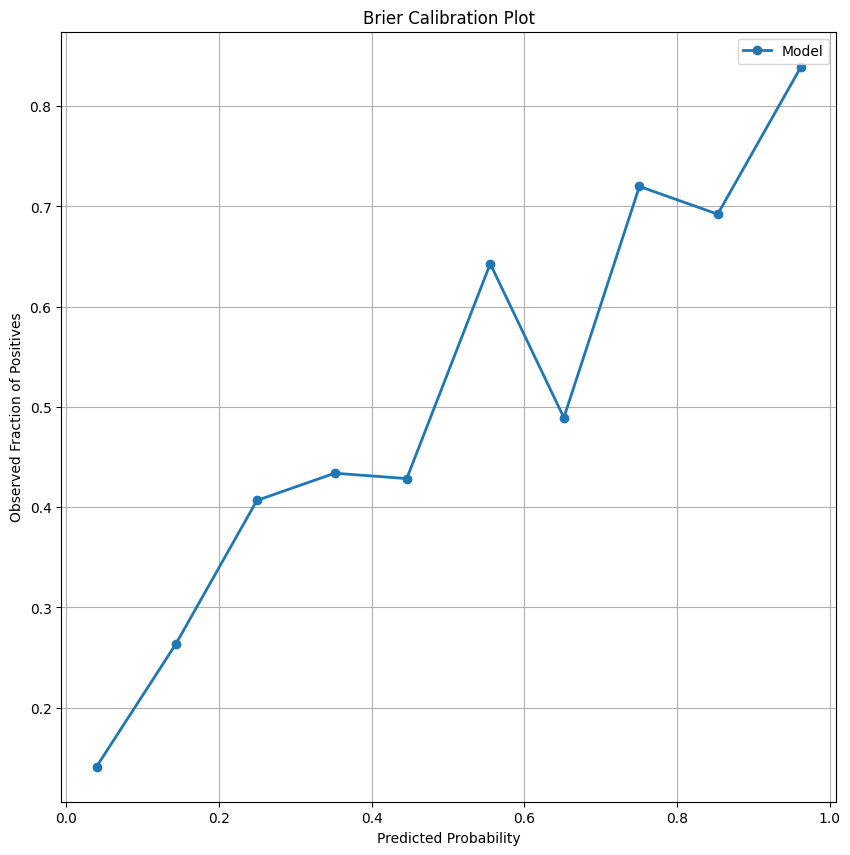

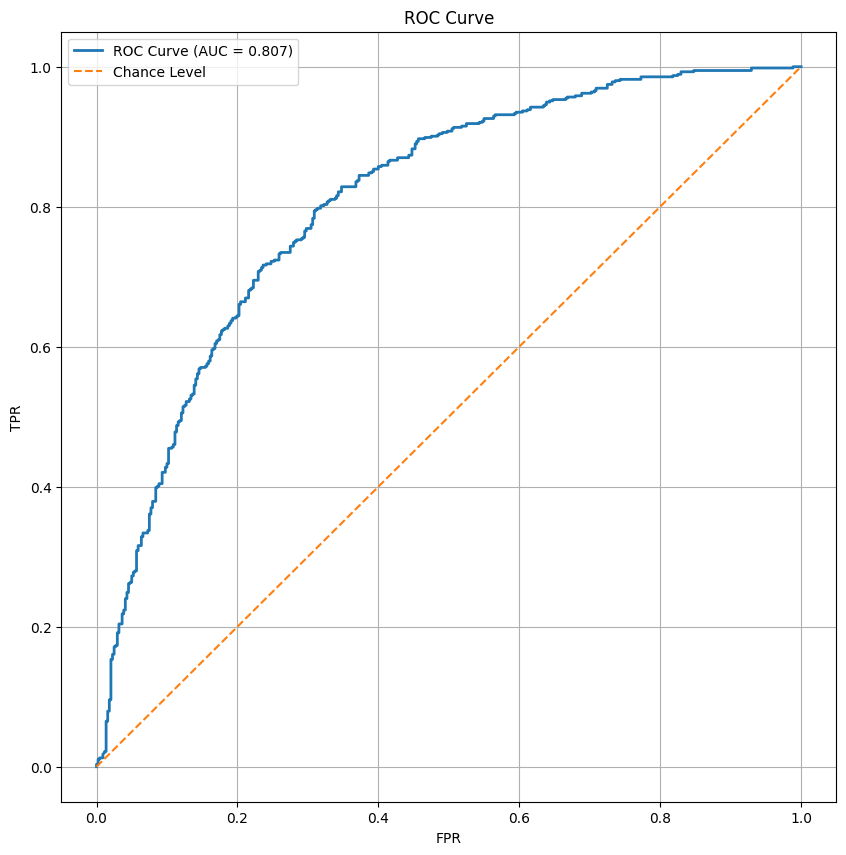

In [29]:
# Fit the best hyperparameters to the entire training set and evaluate on the heldout test set
best_params_xgb = {'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.1, 'min_child_weight': 5, 'subsample': 1.0, 'colsample_bytree': 0.7, 'gamma': 0, 'reg_lambda': 1.0, 'reg_alpha': 1.0, 'random_state': 30}
scale_pos_weight = sum(nfl_match_train['pass_result'] == 0) / sum(nfl_match_train['pass_result'] == 1)
xgb_model_best = XGBClassifier(**best_params_xgb, scale_pos_weight = scale_pos_weight, use_label_encoder = False, eval_metric = 'logloss')

xgb_model_best.fit(x_train_full, y_train_full)
y_pred_full_xgb = xgb_model_best.predict(x_test_full)
y_prob_full_xgb = xgb_model_best.predict_proba(x_test_full)[:, 1]

# Calculate evaluation metrics with respect to the heldout test set
brier_heldout_xgb = brier_score_loss(y_test_full, y_prob_full_xgb)
acc_heldout_xgb = accuracy_score(y_test_full, y_pred_full_xgb)
prec_heldout_xgb = precision_score(y_test_full, y_pred_full_xgb)
recall_heldout_xgb = recall_score(y_test_full, y_pred_full_xgb)
f1_heldout_xgb = f1_score(y_test_full, y_pred_full_xgb)
roc_auc_heldout_xgb = roc_auc_score(y_test_full, y_prob_full_xgb)

print("Final Heldout Test Metrics (XGBoost):")
print("Brier:", brier_heldout_xgb)
print("Accuracy:", acc_heldout_xgb)
print("Precision:", prec_heldout_xgb)
print("Recall:", recall_heldout_xgb)
print("F1:", f1_heldout_xgb)
print("AUC", roc_auc_heldout_xgb)

# Plot the confusion matrix for the evaluation on the heldout test set
cm_heldout = confusion_matrix(y_pred_full_xgb, y_test_full)
plt.figure(figsize = (4,4))
sns.heatmap(cm_final, annot = True, fmt = 'd', cmap = 'Blues', cbar = False, 
            xticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'], 
            yticklabels = ['Incomplete Pass (0)', 'Complete Pass (1)'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix - Heldout Test Set (Weeks 12-17)')
plt.tight_layout()
plt.show()

# Plot a brier calibration curve 
prob_true, prob_pred = calibration_curve(y_test_full, y_prob_full_xgb, n_bins=10)
plt.figure(figsize=(10, 10))
plt.plot(prob_pred, prob_true, marker = 'o', linewidth = 2, label = 'Model')
plt.xlabel('Predicted Probability')
plt.ylabel('Observed Fraction of Positives')
plt.title('Brier Calibration Plot')
plt.legend()
plt.grid(True)
plt.show()

# Plot an ROC Curve (TPR vs FPR)
fpr, tpr, thresholds = roc_curve(y_test_full, y_prob_full_xgb)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 10))
plt.plot(fpr, tpr, linewidth=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], linestyle='--', label='Chance Level')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

In [59]:
# Feature Importance from the Random Forest Models
feature_importance_xgb = pd.DataFrame({
    'feature':feature_vars, 
    'importance_score': xgb_model_best.feature_importances_
}).sort_values('importance_score', ascending = False)

print(feature_importance_xgb.head(10))

                      feature  importance_score
21        post_avg_diff_to_cp          0.122679
17               post_min_sep          0.089121
86     target_rec_route_SLANT          0.064631
37  post_avg_diff_to_cp_last5          0.046673
26      pct_wr_closer_to_ball          0.033979
22        post_min_diff_to_cp          0.026774
82        target_rec_route_IN          0.023855
3                 pass_length          0.020601
40     post_avg_sep_vel_last5          0.017254
29   post_avg_wr_closing_rate          0.016861


In [30]:
# Average the predicted probabilities
y_prob_ensemble = 0.6 * y_prob_full_rf + 0.4 * y_prob_full_xgb

# Make predictions on the ensembled probabilities with threshold = 0.5
y_pred_ensemble = (y_prob_ensemble >= 0.5).astype(int)

brier = brier_score_loss(y_test_full, y_prob_ensemble)
acc = accuracy_score(y_test_full, y_pred_ensemble)
prec = precision_score(y_test_full, y_pred_ensemble)
recall = recall_score(y_test_full, y_pred_ensemble)
f1 = f1_score(y_test_full, y_pred_ensemble)
roc_auc = roc_auc_score(y_test_full, y_prob_ensemble)

print(f"Brier: {brier}, Accuracy: {acc}, Precision: {prec}, Recall: {recall}, F1: {f1}, AUC: {roc_auc}")

Brier: 0.1756624449230577, Accuracy: 0.7394366197183099, Precision: 0.7521367521367521, Recall: 0.7942238267148014, F1: 0.7726075504828798, AUC: 0.8088857893009518


### **DBREI METRIC CREATION ABLATION APPROACH**

In [31]:
# Run the final RF and XGBoost model on a feature set with the following (Ablated Model):
#    Pre-release and contextual features remain untouched
#    Post-release features are set to column means

# DBREI will be determined by determining the additive effect of post-release features on DB reactive execution
#   DBREI = Full Model (prob) - Ablated Model (prob)

# Store all of the post release features 
post_release_features = [
    # Features for DB and WR separation while the ball is in the air
    'post_avg_sep',
    'post_min_sep',
    'post_max_sep',
    'post_sep_variability',
    'max_separation_time',
    
    # Features for DB and WR difference for closeness to the ball at the catch point
    'post_avg_diff_to_cp',
    'post_min_diff_to_cp',
    'post_diff_to_cp_variability',
    'post_max_diff_to_cp',
    'pct_db_closer_to_ball',
    'pct_wr_closer_to_ball',
    
    # Features for DB and WR closing rates to the ball
    'post_avg_db_closing_rate',
    'post_max_db_closing_rate',
    'post_avg_wr_closing_rate',
    'post_max_wr_closing_rate',
    
    # Features for DB and WR separation velocities
    'post_avg_db_wr_sep_vel',
    'post_min_db_wr_sep_vel',
    'post_max_db_wr_sep_vel',
    
    # Features for WR deceleration and stopping
    'wr_decels_before',
    
    # Last 5 Frames Tracking Features
    'post_avg_sep_last5',
    'post_min_sep_last5',
    'post_avg_diff_to_cp_last5',
    'post_avg_wr_closing_rate_last5',
    'post_avg_db_closing_rate_last5',
    'post_avg_sep_vel_last5'
]

# Create an ablated test set with the post release features representing feature averages 
x_test_ablated = x_test_full.copy()

# Set the post release features to their averages in x_test_ablated
for pr_feature in post_release_features:
    x_test_ablated[pr_feature] = x_test_full[pr_feature].mean()

In [32]:
# Run both the best RF model and the best XGB model on x_test_ablated
y_prob_abl_rf = rf_model_best.predict_proba(x_test_ablated)[:, 1]
y_prob_abl_xgb = xgb_model_best.predict_proba(x_test_ablated)[:, 1]

# Combine the predicted probabilities
y_prob_abl_ensemble = 0.6 * y_prob_abl_rf + 0.4 * y_prob_abl_xgb

In [55]:
# Now create the DBREI (Defensive Back Reactive Execution Index) based on model probabilities
dbrei_cols = play_info_cols + ['pass_result'] + ['ball_land_x', 'ball_land_y']
dbrei_df = nfl_match_test[dbrei_cols]

# Calculate the DBREI executions score
dbrei_df['pass_result_pred_abl'] = y_prob_abl_ensemble
dbrei_df['pass_result_pred_full'] = y_prob_ensemble
dbrei_df['dbrei_execution'] = y_prob_abl_ensemble - y_prob_ensemble

# Calculate DBREI outcome adjustment score
dbrei_df['dbrei_outcome_adj'] = (
    dbrei_df['pass_result'] - dbrei_df['pass_result_pred_full']
) * 0.20

# Calculate the total DBREI
dbrei_df['dbrei_total'] = dbrei_df['dbrei_execution'] - dbrei_df['dbrei_outcome_adj']

# Scale the DBREI by *100
dbrei_df['dbrei_total'] = dbrei_df['dbrei_total'] * 100
dbrei_df['dbrei_execution'] = dbrei_df['dbrei_execution'] * 100
dbrei_df['dbrei_outcome_adj'] = dbrei_df['dbrei_outcome_adj'] * 100

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\1309010225.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dbrei_df['pass_result_pred_abl'] = y_prob_abl_ensemble
C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\1309010225.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dbrei_df['pass_result_pred_full'] = y_prob_ensemble
C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\1309010225.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

In [34]:
# Determine the average DBREI_execution, DBREI_outcome_adj, and dbrei_total by DB 
dbrei_db_level = dbrei_df.groupby(['primary_def_name', 'primary_def_team']).agg(
    {
        'dbrei_execution' : 'mean', 
        'dbrei_outcome_adj' : 'mean', 
        'dbrei_total' : 'mean', 
        'pass_result' : lambda x : 1 - x.mean(), 
        'game_id' : 'count'
    }
).reset_index() 

# Set columns for dbrei_db_level
dbrei_db_level.columns = ['db_name', 'db_team', 'dbrei_execution', 
                          'dbrei_outcome_adj', 'dbrei_total', 
                          'incompletion_rate', 'play_count']

# Only consider DBs who have been a part of more than 10 plays
dbrei_db_level = dbrei_db_level[dbrei_db_level['play_count'] >= 10]

# Sort dbrei_db_level by the dbrei_total
dbrei_db_level = dbrei_db_level.sort_values('dbrei_total', ascending = False).reset_index(drop = True)

In [35]:
# The dbrei_db_level dataframe shows the average dbrei_metric across plays played by each defensive back in 2023
dbrei_db_level

,db_name,db_team,dbrei_execution,dbrei_outcome_adj,dbrei_total,incompletion_rate,play_count
0,Sauce Gardner,NYJ,34.961348,-1.201324,36.162671,0.636364,11
1,Michael Carter II,NYJ,35.411269,1.027198,34.384071,0.538462,13
2,Charvarius Ward,SF,31.230101,-0.904636,32.134737,0.538462,13
3,Chidobe Awuzie,CIN,30.432575,-1.427414,31.859989,0.615385,13
4,Joey Porter Jr.,PIT,35.668393,3.826798,31.841595,0.400000,10
5,L'Jarius Sneed,KC,29.287322,-1.666044,30.953366,0.588235,17
6,Fabian Moreau,DEN,33.669420,3.259870,30.409551,0.363636,11
7,D.J. Reed,NYJ,29.066531,-0.810118,29.876648,0.529412,17
8,Alontae Taylor,NO,24.471041,-5.335492,29.806533,0.714286,14
9,Carrington Valentine,GB,31.126762,1.701419,29.425343,0.454545,11


### **DBREI VISUALIZATIONS GALLERY**

In [38]:
# Pull team and player logos from nflreadpy
teams = nfl.load_teams()
players = nfl.load_players()

# Convert team and players to Pandas Dataframe
teams = teams.to_pandas()
players = players.to_pandas()

# Merge the team data to the player data
logos = pd.merge(players, teams, left_on = 'latest_team', right_on = 'team_abbr', how = 'inner')

# Determine unique logos for players
logos_unique = (
    logos
    .sort_values('latest_team')
    .drop_duplicates(subset='display_name', keep='last')
)

# Load images from URL
def load_image_from_url(url, zoom= 1.5, max_px=520):
    try:
        response = requests.get(url, timeout=5)
        img = Image.open(BytesIO(response.content)).convert("RGBA")

        w, h = img.size
        scale = max_px / max(w, h)
        img = img.resize(
            (int(w * scale), int(h * scale)),
            Image.LANCZOS
        )

        return OffsetImage(img, zoom=zoom)

    except Exception as e:
        print(f"Logo load error: {e}")
        return None

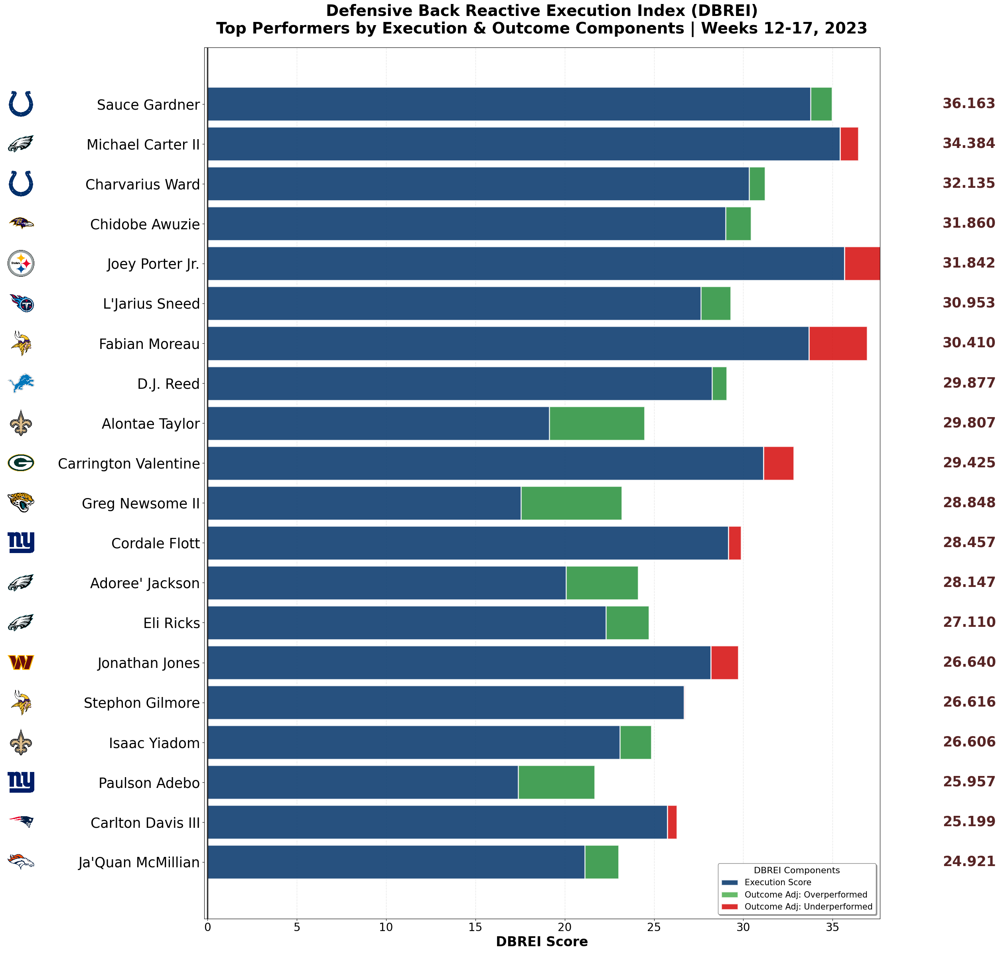

In [41]:
# Stacked Bar Chart for DBREI Execution and DBREI Outcome Adjustment
def dbrei_stacked_bar(dbrei_db_level, logos_unique, top_n=20):
    # Merge logos data with the dbrei_db_level data for plotting
    plot_dbrei = dbrei_db_level.merge(
        logos_unique[['display_name', 'latest_team', 'team_color', 'team_color2', 'team_logo_espn']],
        left_on=['db_name'], 
        right_on=['display_name'], 
        how='left'
    )

    # Take top N and sort by dbrei_total (ascending for bottom-to-top ordering)
    plot_dbrei = plot_dbrei.head(top_n).sort_values('dbrei_total', ascending=True).reset_index(drop=True)

    # Set up the ploting figure
    fig, ax = plt.subplots(figsize=(24, max(14, len(plot_dbrei) * 1.2)))
    y_pos = np.arange(len(plot_dbrei))
    
    # Set the DBREI execution color
    exec_color = '#013369'  # Blue for execution

    for idx, row in plot_dbrei.iterrows():
        # Plot the DBREI execution scores (main bar)
        ax.barh(
            y_pos[idx],
            row['dbrei_execution'],
            color=exec_color,
            alpha=0.85,
            edgecolor='white',
            linewidth=2,
            height=0.85
        )

        # Adjust the color for the outcome adjustment to visualize its sign
        if row['dbrei_outcome_adj'] >= 0:
            adj_color = '#D50A0A' # penalty
        else:
            adj_color = '#4CAF50' # bonus
        
        # Plot the DBREI outcome adjustment scores (stacked on top)
        ax.barh(
            y_pos[idx],
            row['dbrei_outcome_adj'],
            left=row['dbrei_execution'],
            color=adj_color,
            alpha=0.85,
            edgecolor='white',
            linewidth=2,
            height=0.85
        )

        # Include the total DBREI score next to the stacked bars
        total = row['dbrei_total']
        max_total = plot_dbrei['dbrei_total'].max()
        ax.text(
            max_total + 5.0,  # Fixed position based on max value
            y_pos[idx],
            f"{total:.3f}",
            va='center',
            ha='left',  # Left-aligned so all values start at same x position
            fontsize=25,
            fontweight='700',
            color="#572424"
        )

        # Add team logo to the left of player name
        if pd.notna(row['team_logo_espn']):
            img = load_image_from_url(row['team_logo_espn'], zoom=0.1)
            if img:
                ab = AnnotationBbox(
                    img,
                    (-0.25, y_pos[idx]),
                    xycoords=('axes fraction', 'data'),
                    frameon=False,
                    box_alignment=(1, 0.5)
                )
                ax.add_artist(ab)
    
    # Player names on the y-axis
    ax.set_yticks(y_pos)
    ax.set_yticklabels(plot_dbrei['db_name'], fontsize=25, fontweight='500')
    
    # X-axis with DBREI scores
    ax.set_xlabel('DBREI Score', fontsize=24, fontweight='600')
    ax.tick_params(axis='x', labelsize=20)
    
    max_val = plot_dbrei['dbrei_total'].max()
    min_val = min(0, plot_dbrei[['dbrei_execution', 'dbrei_total']].min().min())
    ax.set_xlim(min_val - 0.2, max_val + 1.5)

    # Title for plot
    ax.set_title(
        'Defensive Back Reactive Execution Index (DBREI)\nTop Performers by Execution & Outcome Components | Weeks 12-17, 2023',
        fontsize=28,
        fontweight='bold',
        pad=25
    )

    # Include a vertical reference line
    ax.axvline(0, color='black', linewidth=2.5, linestyle='-', alpha=0.8)

    # Plotting grid
    ax.grid(axis='x', linestyle='--', alpha=0.3, linewidth=1)
    ax.set_axisbelow(True)

    # Legend with actual colors used - larger
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=exec_color, alpha=0.85, edgecolor='white', linewidth=2, 
              label='Execution Score'),
        Patch(facecolor='#4CAF50', alpha=0.85, edgecolor='white', linewidth=2, 
              label='Outcome Adj: Overperformed'),
        Patch(facecolor='#D50A0A', alpha=0.85, edgecolor='white', linewidth=2, 
              label='Outcome Adj: Underperformed')
    ]
    ax.legend(
        handles=legend_elements,
        loc='lower right',
        frameon=True,
        fontsize=15,
        edgecolor='gray',
        fancybox=True,
        shadow=True,
        title='DBREI Components',
        title_fontsize=16
    )

    # Adjust layout to accommodate team logos
    plt.tight_layout()
    plt.subplots_adjust(left=0.16)

    return fig

# Call the dbrei_stacked_bar function and save the figure
fig = dbrei_stacked_bar(dbrei_db_level, logos_unique, top_n=20)
plt.savefig('dbrei_stacked_bars.png', dpi=300, bbox_inches='tight')
plt.show()

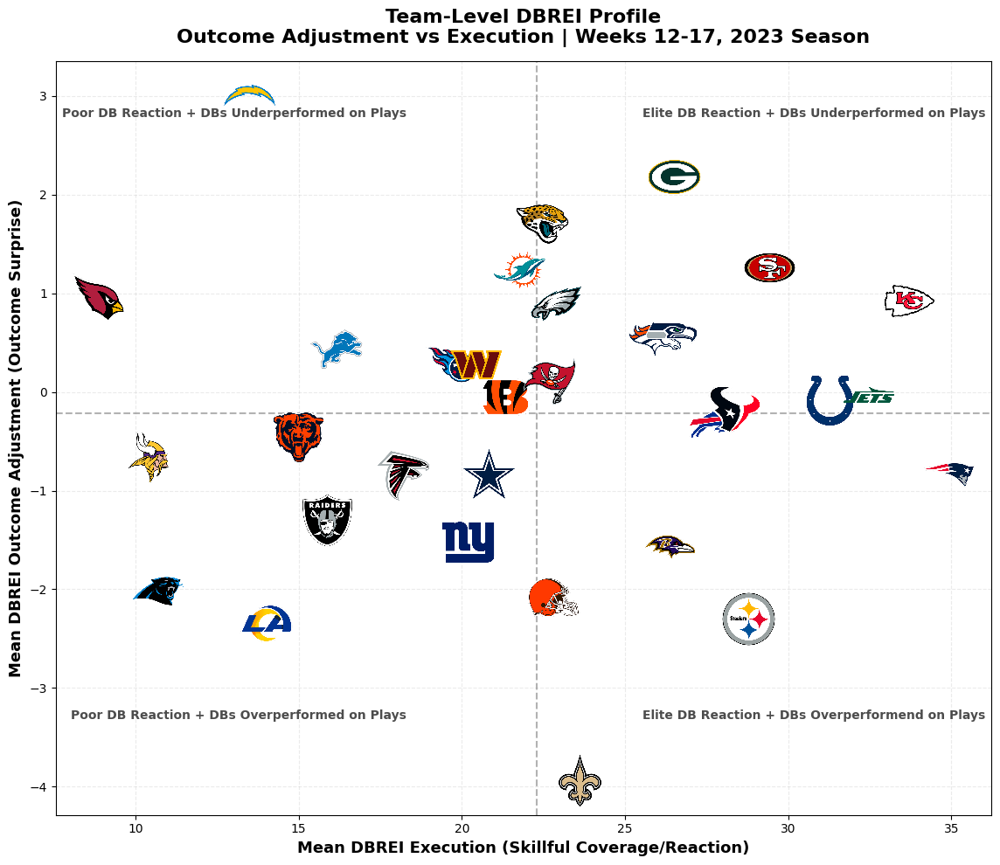

In [44]:
# Determine the avearge DBREI execution and outcome adjustments
#   for all NFL Teams (2023 season, Weeks 12-17)
dbrei_team_level = (
    dbrei_df
    .groupby('primary_def_team')
    .agg(
        dbrei_exec_mean = ('dbrei_execution', 'mean'), 
        dbrei_outcome_adj_mean = ('dbrei_outcome_adj', 'mean'), 
        n_plays = ('dbrei_total', 'count')
    )
    .reset_index()
)

# Merge the team espn logos to the dbrei_team_level dataframe
plot_dbrei_team = pd.merge(dbrei_team_level, teams[['team_abbr', 'team_logo_espn']], left_on = ['primary_def_team'], 
                            right_on = ['team_abbr'], how = 'left')

# Plot the DBREI components for all NFL teams (DBREI Execution vs DBREI Outcome Adjustment)
fig, ax = plt.subplots(figsize=(12, 10))
y_mean = plot_dbrei_team['dbrei_outcome_adj_mean'].mean()
x_mean = plot_dbrei_team['dbrei_exec_mean'].mean()

# Quadrant lines
ax.axhline(y_mean, linestyle='--', color='gray', alpha=0.6)
ax.axvline(x_mean, linestyle='--', color='gray', alpha=0.6)

# Plot the points for the DBREI components for each of the teams
ax.scatter(
    plot_dbrei_team['dbrei_exec_mean'],
    plot_dbrei_team['dbrei_outcome_adj_mean'],
    s=1,
    alpha=0
)

# Plot team logos
for _, row in plot_dbrei_team.iterrows():
    if pd.notna(row['team_logo_espn']):
        img = load_image_from_url(row['team_logo_espn'], zoom=0.09)
        if img:
            ab = AnnotationBbox(
                img,
                (row['dbrei_exec_mean'], row['dbrei_outcome_adj_mean']),
                frameon=False
            )
            ax.add_artist(ab)

ax.set_xlabel('Mean DBREI Execution (Skillful Coverage/Reaction)', fontsize=13, fontweight='600')
ax.set_ylabel('Mean DBREI Outcome Adjustment (Outcome Surprise)', fontsize=13, fontweight='600')

ax.text(x_mean + 3.25, y_mean + 3.00, 'Elite DB Reaction + DBs Underperformed on Plays',
        fontsize=10, fontweight='600', alpha=0.7)
ax.text(x_mean - 4.00, y_mean + 3.000, 'Poor DB Reaction + DBs Underperformed on Plays',
        fontsize=10, ha = 'right', fontweight='600', alpha=0.7)
ax.text(x_mean + 3.25, y_mean - 3.00, 'Elite DB Reaction + DBs Overperformend on Plays',
        fontsize=10, va='top', fontweight = '600', alpha=0.7)
ax.text(x_mean - 4.00, y_mean - 3.00, 'Poor DB Reaction + DBs Overperformed on Plays',
        fontsize=10, ha='right', va='top', fontweight = '600', alpha=0.7)

ax.set_title(
    'Team-Level DBREI Profile\nOutcome Adjustment vs Execution | Weeks 12-17, 2023 Season',
    fontsize=16,
    fontweight='bold',
    pad=15
)

ax.grid(alpha=0.25, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('dbrei_team_level.png', dpi=300, bbox_inches='tight')
plt.show()

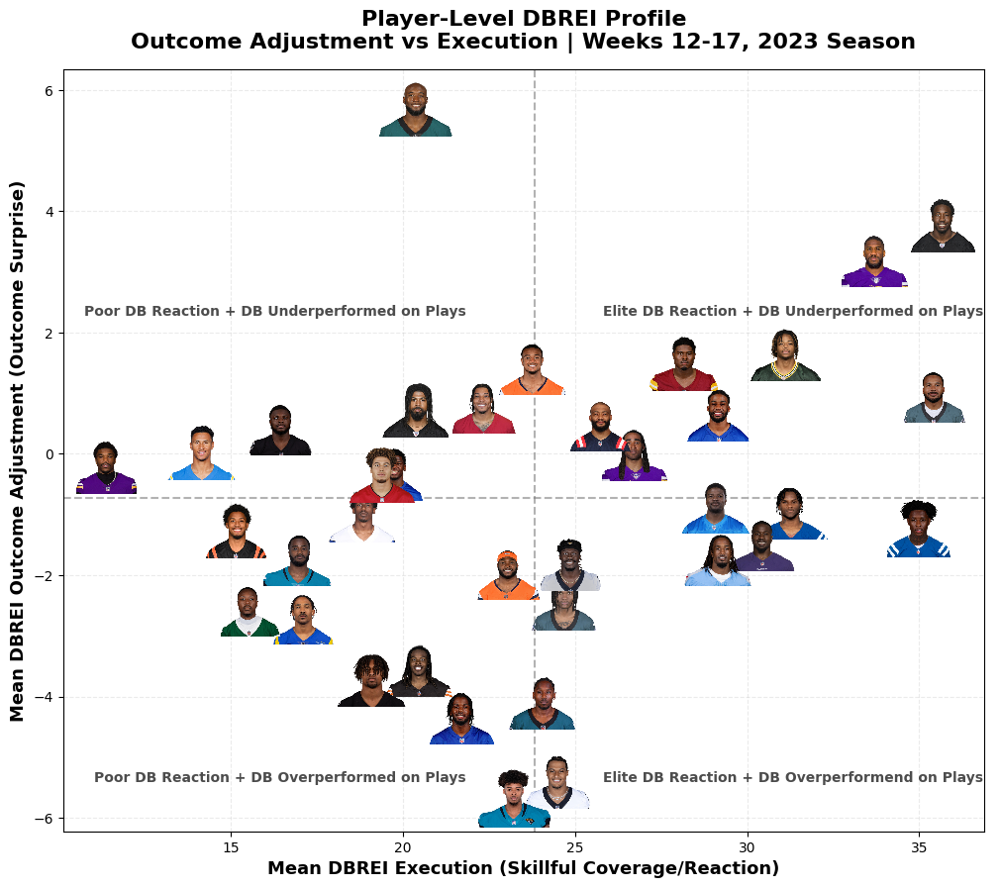

In [50]:
# Merge the player headshots to the dbrei_db_level dataframe
plot_dbrei_player = pd.merge(dbrei_db_level, logos_unique[['display_name', 'headshot']], left_on = ['db_name'], 
                            right_on = ['display_name'], how = 'left')

# Plot the DBREI components for top rated DBREI DBs (DBREI Execution vs DBREI Outcome Adjustment)
fig, ax = plt.subplots(figsize=(12, 10))
y_mean = plot_dbrei_player['dbrei_outcome_adj'].mean()
x_mean = plot_dbrei_player['dbrei_execution'].mean()

# Quadrant lines
ax.axhline(y_mean, linestyle='--', color='gray', alpha=0.6)
ax.axvline(x_mean, linestyle='--', color='gray', alpha=0.6)

# Plot the DBREI execution and outcome adjustments for players
ax.scatter(
    plot_dbrei_player['dbrei_execution'],
    plot_dbrei_player['dbrei_outcome_adj'],
    s=1,
    alpha=0
)

# Plot headshots for players
for _, row in plot_dbrei_player.iterrows():
    if pd.notna(row['headshot']):
        img = load_image_from_url(row['headshot'], zoom=0.12)
        if img:
            ab = AnnotationBbox(
                img,
                (row['dbrei_execution'], row['dbrei_outcome_adj']),
                frameon=False
            )
            ax.add_artist(ab)

# Set the labels for the x and y-axis
ax.set_xlabel('Mean DBREI Execution (Skillful Coverage/Reaction)', fontsize=13, fontweight='600')
ax.set_ylabel('Mean DBREI Outcome Adjustment (Outcome Surprise)', fontsize=13, fontweight='600')

# Label the 4 quadrants based off DBREI execution and DBREI outcome adjustment
ax.text(x_mean + 2.00, y_mean + 3.00, 'Elite DB Reaction + DB Underperformed on Plays',
        fontsize=10, fontweight='600', alpha=0.7)
ax.text(x_mean - 2.00, y_mean + 3.00, 'Poor DB Reaction + DB Underperformed on Plays',
        fontsize=10, ha = 'right', fontweight='600', alpha=0.7)
ax.text(x_mean + 2.00, y_mean - 4.50, 'Elite DB Reaction + DB Overperformend on Plays',
        fontsize=10, va='top', fontweight = '600', alpha=0.7)
ax.text(x_mean - 2.00, y_mean - 4.50, 'Poor DB Reaction + DB Overperformed on Plays',
        fontsize=10, ha='right', va='top', fontweight = '600', alpha=0.7)

# Set the title for the plot
ax.set_title(
    'Player-Level DBREI Profile\nOutcome Adjustment vs Execution | Weeks 12-17, 2023 Season',
    fontsize=16,
    fontweight='bold',
    pad=15
)

ax.grid(alpha=0.25, linestyle='--')
ax.set_axisbelow(True)

plt.savefig('dbrei_player_level.png', dpi=300, bbox_inches='tight')
plt.show()

In [52]:
def draw_football_field(ax):
    """
    Draw an NFL football field with proper dimensions and markings
    """
    # Field dimensions (120 yards long including end zones, 53.3 yards wide)
    # X: 0-120 yards, Y: 0-53.3 yards
    
    # Set field color
    ax.set_facecolor('#2d5016')  # Dark green
    
    # Field boundaries
    ax.plot([0, 120], [0, 0], 'white', linewidth=3)
    ax.plot([0, 120], [53.3, 53.3], 'white', linewidth=3)
    ax.plot([0, 0], [0, 53.3], 'white', linewidth=3)
    ax.plot([120, 120], [0, 53.3], 'white', linewidth=3)
    
    # End zones (shaded)
    ax.add_patch(Rectangle((0, 0), 10, 53.3, alpha=0.15, color='red', zorder=0))
    ax.add_patch(Rectangle((110, 0), 10, 53.3, alpha=0.15, color='blue', zorder=0))
    
    # End zone text
    ax.text(5, 26.65, 'END ZONE', fontsize=18, ha='center', va='center',
           color='white', fontweight='bold', rotation=90, alpha=0.5)
    ax.text(115, 26.65, 'END ZONE', fontsize=18, ha='center', va='center',
           color='white', fontweight='bold', rotation=90, alpha=0.5)
    
    # Yard lines (every 10 yards)
    for yard in range(10, 120, 10):
        ax.axvline(yard, color='white', linewidth=1.5, alpha=0.5, zorder=0)
        
        # Yard markers
        if 10 <= yard <= 110:
            yard_num = min(yard - 10, 110 - yard) if yard != 60 else 50
            if yard_num > 0:
                # Top side
                ax.text(yard, 55, str(yard_num), fontsize=12, ha='center', 
                       color='white', fontweight='bold', alpha=0.8)
                # Bottom side
                ax.text(yard, -1.5, str(yard_num), fontsize=12, ha='center',
                       color='white', fontweight='bold', alpha=0.8)
    
    # 50 yard line (midfield) - highlighted
    ax.axvline(60, color='yellow', linewidth=3, alpha=0.6, zorder=0)
    ax.text(60, -3.5, '50', fontsize=14, ha='center', color='yellow', fontweight='bold')
    
    # Hash marks (NFL hash marks at 18.5 and 34.8 yards from sideline)
    hash_left = 18.5
    hash_right = 34.8
    for yard in range(11, 110, 1):
        ax.plot([yard, yard], [hash_left - 0.3, hash_left + 0.3], 
               'white', linewidth=1, alpha=0.5, zorder=0)
        ax.plot([yard, yard], [hash_right - 0.3, hash_right + 0.3], 
               'white', linewidth=1, alpha=0.5, zorder=0)
    
    # Set limits and aspect
    ax.set_xlim(-5, 125)
    ax.set_ylim(-5, 58.3)
    ax.set_aspect('equal')
    
    # Labels
    ax.set_xlabel('Field Position (Yards)', fontsize=13, fontweight='600', color='white')
    ax.set_ylabel('Field Width (Yards)', fontsize=13, fontweight='600', color='white')
    
    # Tick colors
    ax.tick_params(colors='white', labelsize=11)
    
    return ax

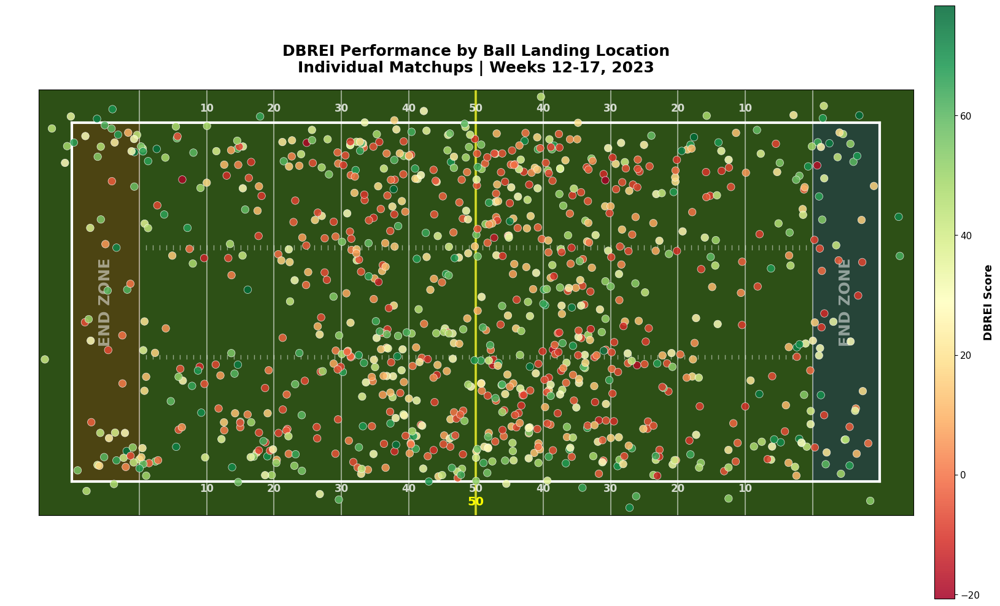

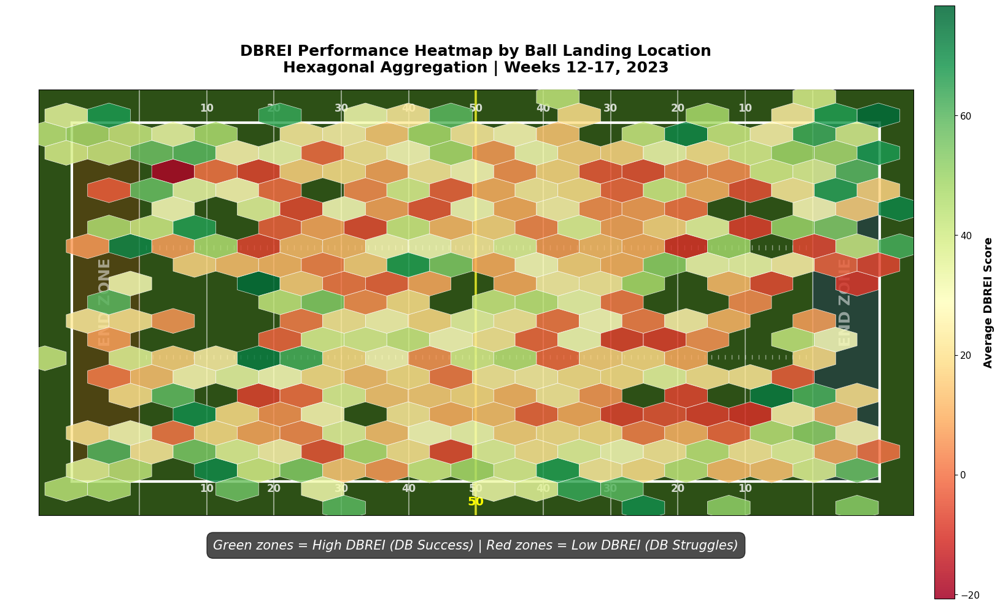

In [79]:
def plot_dbrei_scatter_field(dbrei_df):
    """
    Scatter plot of DBREI scores by ball landing location
    """
    fig, ax = plt.subplots(figsize=(18, 10))
    fig.patch.set_facecolor('#FFFFFF')
    
    # Draw field
    ax = draw_football_field(ax)

    vmin = dbrei_df['dbrei_total'].min()
    vmax = dbrei_df['dbrei_total'].max()
    
    # Create scatter plot
    scatter = ax.scatter(
        dbrei_df['ball_land_x'],
        dbrei_df['ball_land_y'],
        c=dbrei_df['dbrei_total'],
        s=80,
        cmap='RdYlGn',  # Red (bad) to Yellow to Green (good)
        vmin=vmin,
        vmax=vmax,
        alpha=0.85,
        edgecolors='white',
        linewidth=0.5,
        zorder=5
    )
    
    # Colorbar
    cbar = plt.colorbar(scatter, ax=ax, pad=0.02, aspect=30)
    cbar.set_label('DBREI Score', fontsize=13, fontweight='600', color='black')
    cbar.ax.tick_params(labelsize=11, colors='black')
    
    # Title
    ax.set_title(
        'DBREI Performance by Ball Landing Location\n'
        'Individual Matchups | Weeks 12-17, 2023',
        fontsize=18, fontweight='bold', color='black', pad=20
    )
    
    plt.tight_layout()
    return fig


def plot_dbrei_hexbin_field(dbrei_df):
    """
    Hexbin heatmap showing average DBREI by field zone
    """
    fig, ax = plt.subplots(figsize=(18, 10))
    fig.patch.set_facecolor('#FFFFFF')
    
    # Draw field
    ax = draw_football_field(ax)

    vmin = dbrei_df['dbrei_total'].min()
    vmax = dbrei_df['dbrei_total'].max()
    
    # Create hexbin plot
    hexbin = ax.hexbin(
        dbrei_df['ball_land_x'],
        dbrei_df['ball_land_y'],
        C=dbrei_df['dbrei_total'],
        gridsize=20,
        cmap='RdYlGn',
        vmin=vmin,
        vmax=vmax,
        alpha=0.85,
        edgecolors='white',
        linewidths=0.5,
        reduce_C_function=np.mean,
        zorder=5
    )   
    
    # Colorbar
    cbar = plt.colorbar(hexbin, ax=ax, pad=0.02, aspect=30)
    cbar.set_label('Average DBREI Score', fontsize=13, fontweight='600', color='black')
    cbar.ax.tick_params(labelsize=11, colors='black')
    
    # Title
    ax.set_title(
        'DBREI Performance Heatmap by Ball Landing Location\n'
        'Hexagonal Aggregation | Weeks 12-17, 2023',
        fontsize=18, fontweight='bold', color='black', pad=20
    )
    
    # Add annotation
    ax.text(
        60, -10.0,
        'Green zones = High DBREI (DB Success) | Red zones = Low DBREI (DB Struggles)',
        fontsize=15, ha='center', color='white', style='italic',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='black', alpha=0.7)
    )
    
    plt.tight_layout()
    return fig

fig1 = plot_dbrei_scatter_field(dbrei_df)
plt.savefig('dbrei_field_scatter_final.png', dpi=300, bbox_inches='tight', facecolor='#FFFFFF')
plt.show()
    
fig2 = plot_dbrei_hexbin_field(dbrei_df)
plt.savefig('dbrei_field_hexbin_final.png', dpi=300, bbox_inches='tight', facecolor='#FFFFFF')
plt.show()

In [59]:
# Consider plays for Sauce Gardner from Weeks 12-17
dbrei_sg_df = dbrei_df[dbrei_df['primary_def_name'] == 'Sauce Gardner']

# Calculate the execution and outcome adjustment mean among plays for Sauce Gardner
exec_mean = dbrei_sg_df['dbrei_execution'].mean()
outcome_adj_mean = dbrei_sg_df['dbrei_outcome_adj'].mean()

# Define conditions
conditions = [
    (dbrei_sg_df['dbrei_execution'] >= exec_mean) & (dbrei_sg_df['dbrei_outcome_adj'] >= outcome_adj_mean),
    (dbrei_sg_df['dbrei_execution'] >= exec_mean) & (dbrei_sg_df['dbrei_outcome_adj'] < outcome_adj_mean),
    (dbrei_sg_df['dbrei_execution'] < exec_mean) & (dbrei_sg_df['dbrei_outcome_adj'] >= outcome_adj_mean),
    (dbrei_sg_df['dbrei_execution'] < exec_mean) & (dbrei_sg_df['dbrei_outcome_adj'] < outcome_adj_mean)
]

# Corresponding quadrant labels
choices = [
    'Elite Exec + Underperforming Outcome',
    'Elite Exec + Overperforming Outcome',
    'Poor Exec + Underperforming Outcome',
    'Poor Exec + Overperforming Outcome'
]

# Assign quadrant
dbrei_sg_df['quadrant'] = np.select(conditions, choices)

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\2425138584.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dbrei_sg_df['quadrant'] = np.select(conditions, choices)


In [60]:
# Select a play from each of the different choices
play_game_id_list = {
    (582, 2023112400), # Poor Exec + Overperforming Outcome
    (1840, 2023121006), # Poor Exec + Underperforming Outcome
    (2170, 2023112400), # Elite Exec + Underperforming Outcome
    (3832, 2023122406) # Elite Exec + Overperforming Outcome
}       

# Pull the tracking data for the selected plays
tracking_sg = rec_def_tracking[
    rec_def_tracking.apply(lambda row: (row['play_id'], row['game_id']) in play_game_id_list, axis=1)
].copy()

# Create a key to merge on: (game_id, play_id)
dbrei_sg_df['game_play_key'] = list(zip(dbrei_sg_df['play_id'], dbrei_sg_df['game_id']))
tracking_sg['game_play_key'] = list(zip(tracking_sg['play_id'], tracking_sg['game_id']))

# Merge the quadrant label into the tracking data
tracking_sg = tracking_sg.merge(
    dbrei_sg_df[['game_play_key', 'quadrant']],
    on='game_play_key',
    how='left'
)

# Drop the key created for the merge
tracking_sg.drop(columns=['game_play_key'], inplace=True)

C:\Users\Sarvesh\AppData\Local\Temp\ipykernel_25460\3899000342.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dbrei_sg_df['game_play_key'] = list(zip(dbrei_sg_df['play_id'], dbrei_sg_df['game_id']))


Max frames across all plays: 32
Creating animation...
Saving animation...
Animation saved!


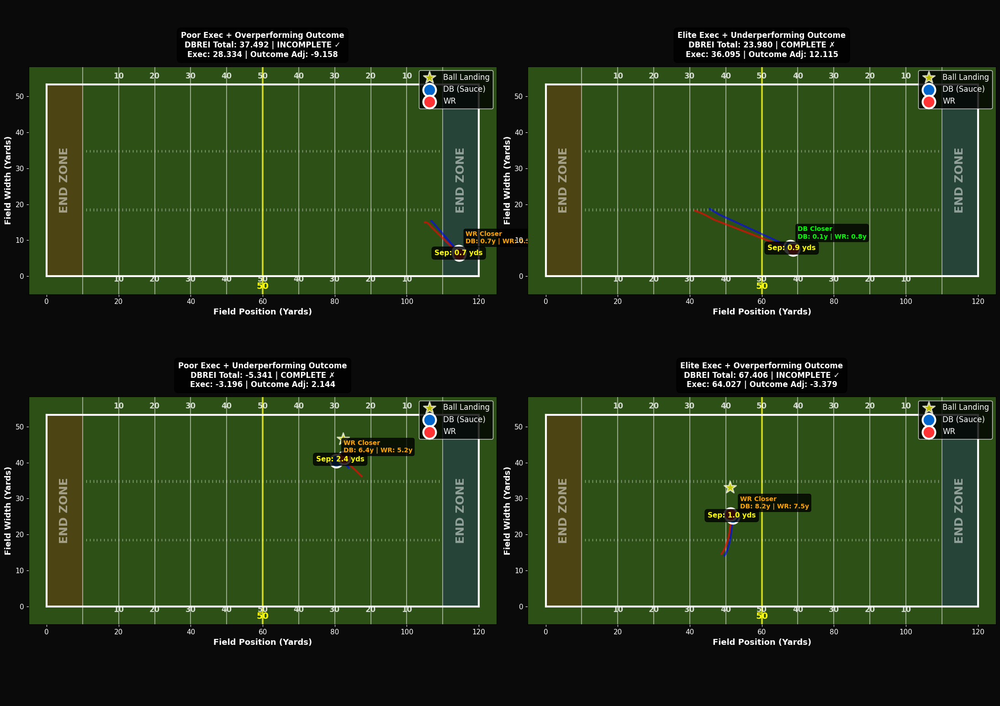

In [ ]:
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle, FancyArrowPatch
import matplotlib.pyplot as plt
import numpy as np

# Store the list of unique plays
unique_plays = tracking_sg[['game_id', 'play_id', 'quadrant']].drop_duplicates().reset_index(drop=True)

# Calculate max frames for each play
play_max_frames = {}
for _, row in unique_plays.iterrows():
    mask = (tracking_sg['game_id'] == row['game_id']) & (tracking_sg['play_id'] == row['play_id'])
    play_max_frames[(row['game_id'], row['play_id'])] = tracking_sg[mask]['frame_id'].max()

max_frames = max(play_max_frames.values())
print(f"Max frames across all plays: {max_frames}")

# Set up plotting figure for 4 subplots
fig, axes = plt.subplots(2, 2, figsize=(22, 16))
fig.patch.set_facecolor('#0a0a0a')
axes = axes.flatten()

# Store the plotting elements
db_points = []
wr_points = []
db_trails = []
wr_trails = []
separation_lines = []
separation_texts = []
velocity_arrows = []
distance_to_ball_texts = []

# Store the last known positions
prev_db_pos = [np.array([[0, 0]]) for _ in range(len(unique_plays))]
prev_wr_pos = [np.array([[0, 0]]) for _ in range(len(unique_plays))]

# Store trail history (last 20 frames for better visualization)
db_trail_history = [[] for _ in range(len(unique_plays))]
wr_trail_history = [[] for _ in range(len(unique_plays))]

for i, ax in enumerate(axes):
    draw_football_field(ax)
    
    # Get play info
    play_info = unique_plays.iloc[i]
    game_id = play_info['game_id']
    play_id = play_info['play_id']
    quadrant = play_info['quadrant']
    
    # Get DBREI scores
    dbrei_info = dbrei_sg_df[
        (dbrei_sg_df['game_id'] == game_id) & 
        (dbrei_sg_df['play_id'] == play_id)
    ]
    
    if not dbrei_info.empty:
        exec_score = dbrei_info.iloc[0]['dbrei_execution']
        outcome_score = dbrei_info.iloc[0]['dbrei_outcome_adj']
        total_score = dbrei_info.iloc[0]['dbrei_total']
        pass_result = dbrei_info.iloc[0]['pass_result']
        ball_x = dbrei_info.iloc[0]['ball_land_x']
        ball_y = dbrei_info.iloc[0]['ball_land_y']
        
        # Determine result text
        result_text = "COMPLETE ✗" if pass_result == 1 else "INCOMPLETE ✓"
        result_color = '#ff4444' if pass_result == 1 else '#44ff44'
        
        title = (f"{quadrant}\n"
                f"DBREI Total: {total_score:.3f} | {result_text}\n"
                f"Exec: {exec_score:.3f} | Outcome Adj: {outcome_score:.3f}")
        
        # Draw ball landing spot (static)
        ax.scatter(ball_x, ball_y, s=400, c='yellow', marker='*',
                  edgecolors='white', linewidths=2, zorder=8, alpha=0.7,
                  label='Ball Landing')
    else:
        title = quadrant
        ball_x, ball_y = None, None
    
    ax.set_title(title, fontsize=12, fontweight='bold', color='white', 
                pad=15, bbox=dict(boxstyle='round,pad=0.5', 
                facecolor='black', alpha=0.8))
    
    # Create scatter points with larger size
    db_dot = ax.scatter([], [], s=400, c='#0066cc', edgecolors='white',
                       linewidths=3, zorder=10, label='DB (Sauce)')
    wr_dot = ax.scatter([], [], s=400, c='#ff3333', edgecolors='white',
                       linewidths=3, zorder=10, label='WR')
    
    # Create lines for trails with gradient effect
    db_trail, = ax.plot([], [], 'b-', linewidth=3, alpha=0.6, zorder=5)
    wr_trail, = ax.plot([], [], 'r-', linewidth=3, alpha=0.6, zorder=5)
    
    # Create separation line
    sep_line, = ax.plot([], [], 'w--', linewidth=2, alpha=0.7, zorder=6)
    
    # Create text for separation distance
    sep_text = ax.text(0, 0, '', fontsize=11, fontweight='bold',
                      color='yellow', ha='center', va='center',
                      bbox=dict(boxstyle='round,pad=0.4', 
                               facecolor='black', alpha=0.8),
                      zorder=11)
    
    # Create text for distance to ball
    dist_text = ax.text(0, 0, '', fontsize=10, fontweight='bold',
                       color='cyan', ha='left', va='bottom',
                       bbox=dict(boxstyle='round,pad=0.3',
                                facecolor='black', alpha=0.8),
                       zorder=11)
    
    # Appnd the dosts and trails for DB and TR
    db_points.append(db_dot)
    wr_points.append(wr_dot)
    db_trails.append(db_trail)
    wr_trails.append(wr_trail)
    separation_lines.append(sep_line)
    separation_texts.append(sep_text)
    distance_to_ball_texts.append(dist_text)
    
    # Add legend
    ax.legend(loc='upper right', fontsize=12, frameon=True,
             facecolor='black', edgecolor='white', labelcolor='white')

# Add frame counter and play phase indicator
frame_text = fig.text(0.5, 0.02, '', ha='center', fontsize=16,
                     fontweight='bold', color='white')
phase_text = fig.text(0.5, 0.96, '', ha='center', fontsize=18,
                     fontweight='bold', color='yellow',
                     bbox=dict(boxstyle='round,pad=0.8',
                              facecolor='black', alpha=0.9))

# Function for animation
def update(frame):
    # Determine play phase
    phase_pct = frame / max_frames
    if phase_pct < 0.4:
        phase = "PRE-SNAP / ROUTE DEVELOPMENT"
        phase_color = 'cyan'
    elif phase_pct < 0.7:
        phase = "BALL IN AIR - REACTION PHASE"
        phase_color = 'yellow'
    else:
        phase = "CATCH POINT - EXECUTION"
        phase_color = 'lime'
    
    reaction_phase = "BALL IN AIR" in phase
    
    phase_text.set_text(phase)
    phase_text.set_color(phase_color)
    
    for i, row in unique_plays.iterrows():

        if reaction_phase:
            db_trails[i].set_alpha(0.9)
            wr_trails[i].set_alpha(0.7)
            separation_lines[i].set_linewidth(3)
            db_points[i].set_sizes([500])
        else:
            db_trails[i].set_alpha(0.6)
            wr_trails[i].set_alpha(0.6)
            separation_lines[i].set_linewidth(2)
            db_points[i].set_sizes([400])

        game_id = row['game_id']
        play_id = row['play_id']
        max_frame = play_max_frames[(game_id, play_id)]
        
        # Get ball landing location
        dbrei_info = dbrei_sg_df[
            (dbrei_sg_df['game_id'] == game_id) & 
            (dbrei_sg_df['play_id'] == play_id)
        ]
        ball_x = dbrei_info.iloc[0]['ball_land_x'] if not dbrei_info.empty else None
        ball_y = dbrei_info.iloc[0]['ball_land_y'] if not dbrei_info.empty else None
        
        if frame > max_frame:
            db_pos = prev_db_pos[i]
            wr_pos = prev_wr_pos[i]
        else:
            # Pull the frame data
            frame_data = tracking_sg[
                (tracking_sg['game_id'] == game_id) &
                (tracking_sg['play_id'] == play_id) & 
                (tracking_sg['frame_id'] == frame)
            ]
            
            db_pos = frame_data[frame_data['player_role'] == 'Defensive Coverage'][['x','y']].to_numpy()
            wr_pos = frame_data[frame_data['player_role'] == 'Targeted Receiver'][['x','y']].to_numpy()
            
            # Update positions
            if len(db_pos) > 0:
                prev_db_pos[i] = db_pos
                db_trail_history[i].append(db_pos[0])
                trail_cap = 35 if 0.4 <= frame / max_frames < 0.7 else 20
                if len(db_trail_history[i]) > trail_cap:
                        db_trail_history[i].pop(0)
            else:
                db_pos = prev_db_pos[i]
            
            if len(wr_pos) > 0:
                prev_wr_pos[i] = wr_pos
                wr_trail_history[i].append(wr_pos[0])
                trail_cap = 35 if 0.4 <= frame / max_frames < 0.7 else 20
                if len(wr_trail_history[i]) > trail_cap:
                        wr_trail_history[i].pop(0)
            else:
                wr_pos = prev_wr_pos[i]
        
        # Update scatter points
        db_points[i].set_offsets(db_pos if len(db_pos) > 0 else np.empty((0, 2)))
        wr_points[i].set_offsets(wr_pos if len(wr_pos) > 0 else np.empty((0, 2)))
        
        # Update trails
        if len(db_trail_history[i]) > 1:
            trail_array = np.array(db_trail_history[i])
            db_trails[i].set_data(trail_array[:, 0], trail_array[:, 1])
        
        if len(wr_trail_history[i]) > 1:
            trail_array = np.array(wr_trail_history[i])
            wr_trails[i].set_data(trail_array[:, 0], trail_array[:, 1])
        
        # Calculate and display separation
        if len(db_pos) > 0 and len(wr_pos) > 0:
            db_x, db_y = db_pos[0]
            wr_x, wr_y = wr_pos[0]
            
            # Draw separation line
            separation_lines[i].set_data([db_x, wr_x], [db_y, wr_y])
            
            # Calculate separation distance
            separation = np.sqrt((wr_x - db_x)**2 + (wr_y - db_y)**2)
            
            # Position text at midpoint
            mid_x, mid_y = (db_x + wr_x) / 2, (db_y + wr_y) / 2
            separation_texts[i].set_position((mid_x, mid_y))
            separation_texts[i].set_text(f'Sep: {separation:.1f} yds')
            
            # Calculate distance to ball (if available)
            if ball_x is not None and ball_y is not None:
                db_to_ball = np.sqrt((ball_x - db_x)**2 + (ball_y - db_y)**2)
                wr_to_ball = np.sqrt((ball_x - wr_x)**2 + (ball_y - wr_y)**2)
                
                # Show who's closer to ball
                if db_to_ball < wr_to_ball:
                    dist_text_str = f'DB Closer\nDB: {db_to_ball:.1f}y | WR: {wr_to_ball:.1f}y'
                    dist_text_color = 'lime'
                else:
                    dist_text_str = f'WR Closer\nDB: {db_to_ball:.1f}y | WR: {wr_to_ball:.1f}y'
                    dist_text_color = 'orange'
                
                distance_to_ball_texts[i].set_position((db_x + 2, db_y + 2))
                distance_to_ball_texts[i].set_text(dist_text_str)
                distance_to_ball_texts[i].set_color(dist_text_color)
    
    # Update frame counter
    frame_text.set_text(f'Frame: {frame}/{max_frames}')
    
    return (db_points + wr_points + db_trails + wr_trails + 
            separation_lines + separation_texts + distance_to_ball_texts +
            [frame_text, phase_text])

# Initialize function
def init():
    for i in range(len(unique_plays)):
        db_points[i].set_offsets(np.empty((0, 2)))
        wr_points[i].set_offsets(np.empty((0, 2)))
        db_trails[i].set_data([], [])
        wr_trails[i].set_data([], [])
        separation_lines[i].set_data([], [])
        separation_texts[i].set_text('')
        distance_to_ball_texts[i].set_text('')
    frame_text.set_text('')
    phase_text.set_text('')
    return (db_points + wr_points + db_trails + wr_trails + 
            separation_lines + separation_texts + distance_to_ball_texts +
            [frame_text, phase_text])

# Build slowed frame schedule
frames = []
for f in range(0, max_frames + 1):
    phase_pct = f / max_frames
    frames.append(f)  # normal speed
    
    # Slow ball-in-air phase
    if 0.4 <= phase_pct < 0.7:
        frames.extend([f, f])  # 3x total


# Create animation
print("Creating animation...")
anim = FuncAnimation(
    fig,
    update,
    init_func=init,
    frames=frames,
    interval=100,  # 100ms = 10 FPS
    blit=True,
    repeat=True
)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])

print("Saving animation...")
anim.save('sauce_gardner_dbrei_execution_final.gif', writer='pillow', fps=10, dpi=100)
print("Animation saved!")
plt.show()

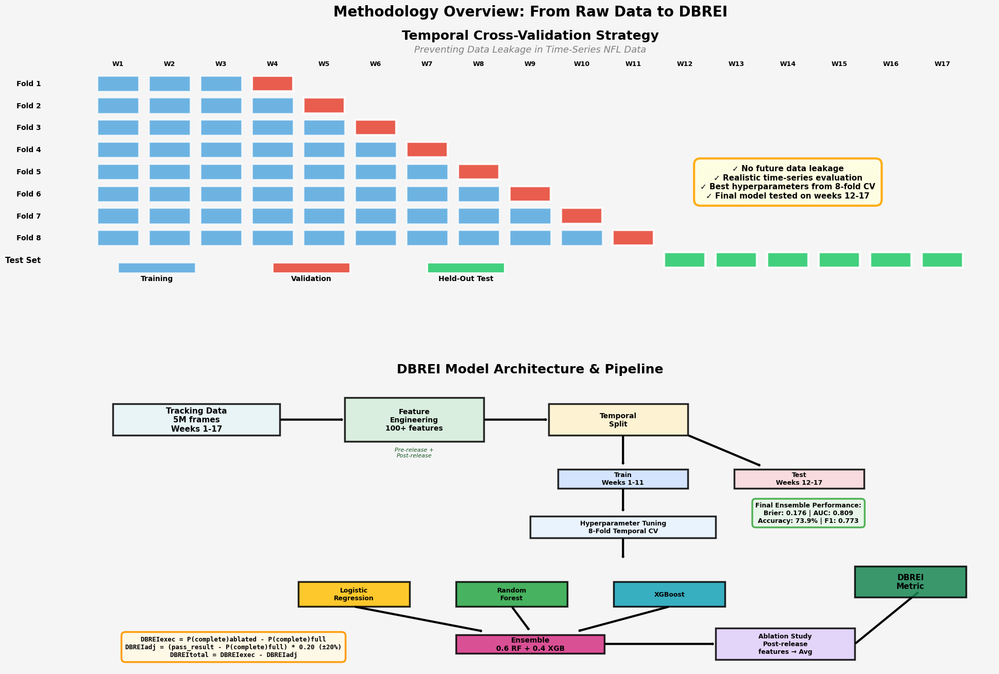

In [93]:
def create_methodology_visualization():
    """
    Visual explanation of temporal CV and model pipeline
    """
    fig = plt.figure(figsize=(20, 14))
    fig.patch.set_facecolor('#f5f5f5')
    
    gs = fig.add_gridspec(2, 1, height_ratios=[1, 1.2], hspace=0.25,
                          left=0.05, right=0.95, top=0.94, bottom=0.05)
    
    # ===== TOP: Temporal Cross-Validation Visualization =====
    ax1 = fig.add_subplot(gs[0])
    ax1.set_xlim(0, 18)
    ax1.set_ylim(0, 10)
    ax1.axis('off')
    
    # Title
    ax1.text(9, 9.5, 'Temporal Cross-Validation Strategy',
            fontsize=18, fontweight='bold', ha='center')
    ax1.text(9, 9, 'Preventing Data Leakage in Time-Series NFL Data',
            fontsize=13, ha='center', style='italic', color='gray')
    
    # Draw week blocks
    week_height = 0.6
    train_color = '#3498db'
    val_color = '#e74c3c'
    test_color = '#2ecc71'
    
    folds = [
        (range(1, 4), 4),
        (range(1, 5), 5),
        (range(1, 6), 6),
        (range(1, 7), 7),
        (range(1, 8), 8),
        (range(1, 9), 9),
        (range(1, 10), 10),
        (range(1, 11), 11),
    ]
    
    y_start = 7.5
    for fold_idx, (train_weeks, val_week) in enumerate(folds):
        y_pos = y_start - fold_idx * 0.85
        
        # Draw training weeks
        for week in train_weeks:
            rect = Rectangle((week - 0.4, y_pos), 0.8, week_height,
                           facecolor=train_color, edgecolor='white',
                           linewidth=2, alpha=0.7)
            ax1.add_patch(rect)
        
        # Draw validation week
        rect = Rectangle((val_week - 0.4, y_pos), 0.8, week_height,
                       facecolor=val_color, edgecolor='white',
                       linewidth=3, alpha=0.9)
        ax1.add_patch(rect)
        
        # Label
        ax1.text(-0.5, y_pos + week_height/2, f'Fold {fold_idx + 1}',
                fontsize=10, va='center', ha='right', fontweight='600')
    
    # Draw held-out test set
    y_test = y_start - len(folds) * 0.85
    for week in range(12, 18):
        rect = Rectangle((week - 0.4, y_test), 0.8, week_height,
                       facecolor=test_color, edgecolor='white',
                       linewidth=3, alpha=0.9)
        ax1.add_patch(rect)
    
    ax1.text(-0.5, y_test + week_height/2, 'Test Set',
            fontsize=11, va='center', ha='right', fontweight='bold')
    
    # Week labels
    for week in range(1, 18):
        ax1.text(week, y_start + 1, f'W{week}',
                fontsize=9, ha='center', fontweight='600')
    
    # Legend
    legend_y = 0.5
    rect1 = Rectangle((1, legend_y), 1.5, 0.4, facecolor=train_color, 
                     edgecolor='white', linewidth=2, alpha=0.7)
    rect2 = Rectangle((4, legend_y), 1.5, 0.4, facecolor=val_color,
                     edgecolor='white', linewidth=2, alpha=0.9)
    rect3 = Rectangle((7, legend_y), 1.5, 0.4, facecolor=test_color,
                     edgecolor='white', linewidth=2, alpha=0.9)
    
    ax1.add_patch(rect1)
    ax1.add_patch(rect2)
    ax1.add_patch(rect3)
    
    ax1.text(1.75, legend_y - 0.3, 'Training', fontsize=10, ha='center', fontweight='600')
    ax1.text(4.75, legend_y - 0.3, 'Validation', fontsize=10, ha='center', fontweight='600')
    ax1.text(7.75, legend_y - 0.3, 'Held-Out Test', fontsize=10, ha='center', fontweight='600')
    
    # Add key insight box
    textstr = ('✓ No future data leakage\n'
              '✓ Realistic time-series evaluation\n'
              '✓ Best hyperparameters from 8-fold CV\n'
              '✓ Final model tested on weeks 12-17')
    props = dict(boxstyle='round,pad=0.8', facecolor='lightyellow', 
                alpha=0.9, edgecolor='orange', linewidth=3)
    ax1.text(14, 4, textstr, fontsize=11, ha='center', va='center',
            bbox=props, fontweight='600')
    
    # ===== BOTTOM: Model Architecture Pipeline =====
    ax2 = fig.add_subplot(gs[1])
    ax2.set_xlim(0, 10)
    ax2.set_ylim(0, 10)
    ax2.axis('off')
    
    # Title
    ax2.text(5, 9.5, 'DBREI Model Architecture & Pipeline',
            fontsize=18, fontweight='bold', ha='center')
    
    def draw_box(ax, x, y, width, height, text, color, fontsize=10):
        rect = Rectangle((x, y), width, height, facecolor=color,
                        edgecolor='black', linewidth=2.5, alpha=0.85)
        ax.add_patch(rect)
        ax.text(x + width/2, y + height/2, text, fontsize=fontsize,
               ha='center', va='center', fontweight='bold',
               wrap=True)
        return rect
    
    def draw_arrow(ax, x1, y1, x2, y2, label=''):
        arrow = FancyArrowPatch((x1, y1), (x2, y2),
                               arrowstyle='->,head_width=0.4,head_length=0.4',
                               color='black', linewidth=3, zorder=1)
        ax.add_patch(arrow)
        if label:
            mid_x, mid_y = (x1 + x2) / 2, (y1 + y2) / 2
            ax.text(mid_x, mid_y + 0.2, label, fontsize=9,
                   ha='center', fontweight='600',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Stage 1: Data
    draw_box(ax2, 0.5, 7.5, 1.8, 1, 'Tracking Data\n5M frames\nWeeks 1-17', '#e8f4f8', 11)
    draw_arrow(ax2, 2.3, 8, 3, 8)
    
    # Stage 2: Feature Engineering
    draw_box(ax2, 3, 7.3, 1.5, 1.4, 'Feature\nEngineering\n100+ features', '#d4edda', 10)
    ax2.text(3.75, 6.8, 'Pre-release +\nPost-release', fontsize=8,
            ha='center', style='italic', color='#155724')
    draw_arrow(ax2, 4.5, 8, 5.2, 8)
    
    # Stage 3: Train/Test Split
    draw_box(ax2, 5.2, 7.5, 1.5, 1, 'Temporal\nSplit', '#fff3cd', 10)
    
    # Split into two paths
    draw_arrow(ax2, 6, 7.5, 6, 6.5)
    draw_arrow(ax2, 6.7, 7.5, 7.5, 6.5)
    
    # Training path
    draw_box(ax2, 5.3, 5.8, 1.4, 0.6, 'Train\nWeeks 1-11', '#cfe2ff', 9)
    draw_arrow(ax2, 6, 5.8, 6, 5)
    
    # Test path
    draw_box(ax2, 7.2, 5.8, 1.4, 0.6, 'Test\nWeeks 12-17', '#f8d7da', 9)
    
    # Stage 4: Model Training
    draw_box(ax2, 5, 4.2, 2, 0.7, 'Hyperparameter Tuning\n8-Fold Temporal CV', '#e7f3ff', 9)
    draw_arrow(ax2, 6, 4.2, 6, 3.5)
    
    # Stage 5: Three Models
    model_y = 2
    draw_box(ax2, 2.5, model_y, 1.2, 0.8, 'Logistic\nRegression', '#ffc107', 9)
    draw_box(ax2, 4.2, model_y, 1.2, 0.8, 'Random\nForest', '#28a745', 9)
    draw_box(ax2, 5.9, model_y, 1.2, 0.8, 'XGBoost', '#17a2b8', 9)
    
    # Arrows to ensemble
    draw_arrow(ax2, 3.1, model_y, 4.5, 1.2)
    draw_arrow(ax2, 4.8, model_y, 5, 1.2)
    draw_arrow(ax2, 6.5, model_y, 5.5, 1.2)
    
    # Stage 6: Ensemble
    draw_box(ax2, 4.2, 0.5, 1.6, 0.6, 'Ensemble\n0.6 RF + 0.4 XGB', '#d63384', 10)
    draw_arrow(ax2, 5.8, 0.8, 7, 0.8)
    
    # Stage 7: Ablation
    draw_box(ax2, 7, 0.3, 1.5, 1, 'Ablation Study\nPost-release\nfeatures → Avg', '#e0cffc', 9)
    draw_arrow(ax2, 8.5, 0.8, 9.2, 2.5)
    
    # Stage 8: DBREI
    draw_box(ax2, 8.5, 2.3, 1.2, 1, 'DBREI\nMetric', '#198754', 11)

    dbrei_df['pass_result'] - dbrei_df['pass_result_pred_full']
    
    # Add formulas
    formula_text = (
        'DBREIexec = P(complete)ablated - P(complete)full\n'
        'DBREIadj = (pass_result - P(complete)full) * 0.20 (±20%)\n'
        'DBREItotal = DBREIexec - DBREIadj'
    )
    props = dict(boxstyle='round,pad=0.6', facecolor='#fff9e6',
                alpha=0.95, edgecolor='#ff9800', linewidth=2.5)
    ax2.text(1.8, 0.7, formula_text, fontsize=9, ha='center',
            va='center', bbox=props, family='monospace', fontweight='600')
    
    # Add evaluation metrics box
    metrics_text = (
        'Final Ensemble Performance:\n'
        'Brier: 0.176 | AUC: 0.809\n'
        'Accuracy: 73.9% | F1: 0.773'
    )
    props2 = dict(boxstyle='round,pad=0.5', facecolor='#e8f5e9',
                 alpha=0.95, edgecolor='#4caf50', linewidth=2.5)
    ax2.text(8, 5, metrics_text, fontsize=9, ha='center',
            va='center', bbox=props2, fontweight='600')
    
    fig.suptitle('Methodology Overview: From Raw Data to DBREI',
                fontsize=20, fontweight='bold', y=0.97)
    
    return fig

# Usage
fig = create_methodology_visualization()
plt.savefig('methodology_architecture.png', dpi=300, bbox_inches='tight')
plt.show()